In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.interpolate import interp1d
from scipy.signal import hilbert
import pyzgy


/opt/anaconda3/lib/python3.12/site-packages/openzgy/impl/file.py:53: UserWarning: seismic store access is not available: No module named 'sdglue'
  warnings.warn("seismic store access is not available: " + str(ex))


In [2]:
#DEV_PATH = "A10.dev"
#LAS_PATH = "A10.las"
#CS_PATH  = "gfaks_check_shots.xlsx"
ZGY_PATH = "/Users/reyikarthik/SPG/ST8511r92.zgy"


In [3]:
zgy = pyzgy.open(ZGY_PATH)   # remember to call zgy.close() at the end
il_values = np.array(zgy.ilines)  #x dirn slices
xl_values = np.array(zgy.xlines)   #y dirn slices
samples   = np.array(zgy.samples)   # time/depth axis
print("IL range:", il_values[0], "->", il_values[-1], "count", len(il_values))
print("XL range:", xl_values[0], "->", xl_values[-1], "count", len(xl_values))
print("Samples:", samples[0], "->", samples[-1], "count", len(samples), "spacing ~", np.median(np.diff(samples)))


IL range: 152 -> 900 count 375
XL range: 150 -> 750 count 301
Samples: 1397.0 -> 2301.67795085907 count 227 spacing ~ 4.002999782562256


# INFO ABOUT THE DATA

In [5]:
import numpy as np
import pprint
import pyzgy

ZGY_PATH = "ST8511r92.zgy"

def print_section(title):
    print("\n" + "="*8 + f" {title} " + "="*8)

# --- Open file ---
zgy = pyzgy.open(ZGY_PATH)
print_section("ZGY object")
print(zgy)   # pyzgy object summary

# --- Generic introspection: attributes and methods ---
print_section("Available attributes / methods (partial)")
members = sorted([m for m in dir(zgy) if not m.startswith("__")])
pprint.pprint(members)

# --- Try common metadata fields (safe attempts) ---
print_section("Attempt common metadata fields")
candidates = [
    "ilines", "xlines", "samples", "nsamples",
    "ntraces", "shape", "sample_rate", "dt",
    "origin", "coords", "z0", "zstart", "zstep",
    "trace_count", "text_header", "text_headers",
    "binary_header", "hdr", "header", "trace_headers"
]

for name in candidates:
    try:
        val = getattr(zgy, name)
        print(f"{name:20s} : {type(val).__name__} -> { (val[:10] if hasattr(val,'__len__') and len(val)>10 else val) }")
    except Exception:
        # try calling as method if attribute missing
        try:
            meth = getattr(zgy, name)
            val = meth()
            print(f"{name + '()':20s} : {type(val).__name__} -> {val}")
        except Exception:
            pass

# --- Print inline/xline and sample info if present ---
print_section("Inline / Xline / Sample info (if available)")
for attr in ("ilines", "xlines", "samples"):
    try:
        arr = getattr(zgy, attr)
        print(f"{attr} -> length: {len(arr)}, first: {arr[0]}, last: {arr[-1]}")
    except Exception:
        print(f"{attr} -> not found")

# --- Sample rate / dt (if present) ---
for candidate in ("sample_rate", "dt", "sample_interval"):
    try:
        print(f"{candidate} : {getattr(zgy, candidate)}")
    except Exception:
        pass

# --- Textual headers ---
print_section("Textual headers (if available)")
try:
    # some pyzgy versions expose text_headers or text_header
    if hasattr(zgy, "text_headers"):
        th = zgy.text_headers
        # th may be list-like
        if isinstance(th, (list, tuple)):
            for i, page in enumerate(th[:5]):
                print(f"--- text header page {i} ---")
                print(page[:500])
        else:
            print(th)
    elif hasattr(zgy, "text_header"):
        print(zgy.text_header[:1000])
    else:
        # fallback: try calling a generic getter
        if callable(getattr(zgy, "get_text_header", None)):
            print(zgy.get_text_header())
        else:
            print("No textual header attribute found.")
except Exception as e:
    print("Error reading text headers:", e)

# --- How to read trace(s) / a small data cube slice ---
print_section("Example reads (safe)")

# Attempt to read a single trace or a small inline slice using several common APIs:
tried = False
# 1) If object supports numpy-like indexing zgy[iline_index, xline_index, sample_index]
try:
    # try a small center sample: pick indices 0 for il/xl or available lists
    il_idx = 0
    xl_idx = 0
    slice_ = zgy[il_idx, xl_idx, :]      # works on some pyzgy versions
    print("Read with zgy[il,xl,:] -> shape:", np.asarray(slice_).shape)
    tried = True
except Exception:
    pass

# 2) If object exposes read or get_trace methods
if not tried:
    for method_name in ("read", "read_trace", "get_trace", "trace"):
        if hasattr(zgy, method_name):
            try:
                meth = getattr(zgy, method_name)
                # try plausible calling styles:
                # - get_trace(il,xl)
                # - get_trace(idx)
                try:
                    tr = meth(0, 0)
                except TypeError:
                    tr = meth(0)
                arr = np.asarray(tr)
                print(f"Read with {method_name} -> shape:", arr.shape)
                tried = True
                break
            except Exception:
                continue

# 3) If zgy supports converting to numpy cube directly
if not tried:
    try:
        cube = np.asarray(zgy)
        print("Converted entire ZGY to numpy array -> shape:", cube.shape)
        tried = True
    except Exception:
        pass

if not tried:
    print("Could not automatically read a trace slice with the tried methods. Check the attribute list above for available APIs.")

# --- Save a small trace (if we have one) ---
try:
    if 'arr' in locals():
        np.save("example_trace.npy", arr)
        print("Wrote example_trace.npy (shape {})".format(arr.shape))
    elif 'slice_' in locals():
        np.save("example_trace.npy", np.asarray(slice_))
        print("Wrote example_trace.npy (shape {})".format(np.asarray(slice_).shape))
    elif 'cube' in locals():
        # save a tiny subset to limit file size
        subset = cube[..., :min(200, cube.shape[-1])]
        np.save("example_cube_subset.npy", subset)
        print("Wrote example_cube_subset.npy (shape {})".format(subset.shape))
except Exception as e:
    print("Error saving example data:", e)

print_section("Done - next steps")
print("If you want, share the printed output and I can tell you exactly which fields to use and show code to extract a full inline/xline/twt axis.")



======== ZGY object ========

======== Available attributes / methods (partial) ========
['_filename',
 'annotinc',
 'annotstart',
 'close',
 'coord_to_index',
 'corners',
 'depth_slice',
 'easting_inc_il',
 'easting_inc_xl',
 'filehandle',
 'gen_cdp_x',
 'gen_cdp_y',
 'gen_trace_header',
 'get_haxis',
 'get_trace',
 'header',
 'iline',
 'ilines',
 'loader',
 'n_ilines',
 'n_samples',
 'n_xlines',
 'northing_inc_il',
 'northing_inc_xl',
 'read_crossline',
 'read_crossline_number',
 'read_inline',
 'read_inline_number',
 'read_subvolume',
 'read_volume',
 'read_zslice',
 'read_zslice_coord',
 'samples',
 'trace',
 'tracecount',
 'unstructured',
 'xline',
 'xlines',
 'zinc']

======== Attempt common metadata fields ========
ilines               : ndarray -> [152 154 156 158 160 162 164 166 168 170]
xlines               : ndarray -> [150 152 154 156 158 160 162 164 166 168]
samples              : ndarray -> [1397.         1401.00299978 1405.00599957 1409.00899935 1413.01199913
 1417.0149

# SURVEY SETUP

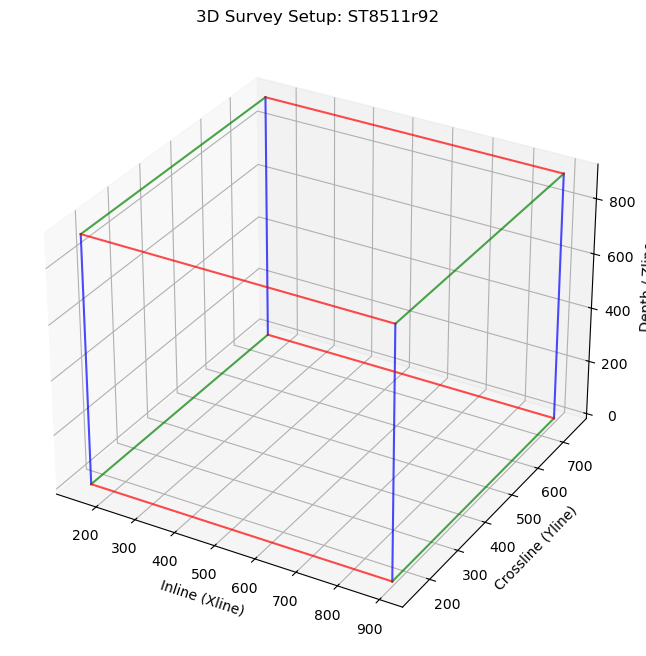

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# -----------------------------
# Survey info from your ZGY
# -----------------------------
x_start, x_end, x_count = 152, 900, 375      # Inlines
y_start, y_end, y_count = 150, 750, 301      # Crosslines
z_count = 227                                 # Samples
z_spacing = 4.00299978                        # Sample spacing (meters)

# Generate arrays
xlines = np.linspace(x_start, x_end, x_count)
crosslines = np.linspace(y_start, y_end, y_count)
zlines = np.arange(0, z_count * z_spacing, z_spacing)

# -----------------------------
# Plot 3D survey outline
# -----------------------------
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Draw grid edges (outline)
for x in [xlines[0], xlines[-1]]:
    for y in [crosslines[0], crosslines[-1]]:
        ax.plot([x, x], [y, y], [zlines[0], zlines[-1]], c='blue', alpha=0.7)
for x in [xlines[0], xlines[-1]]:
    for z in [zlines[0], zlines[-1]]:
        ax.plot([x, x], [crosslines[0], crosslines[-1]], [z, z], c='green', alpha=0.7)
for y in [crosslines[0], crosslines[-1]]:
    for z in [zlines[0], zlines[-1]]:
        ax.plot([xlines[0], xlines[-1]], [y, y], [z, z], c='red', alpha=0.7)

ax.set_xlabel("Inline (Xline)")
ax.set_ylabel("Crossline (Yline)")
ax.set_zlabel("Depth / Zline")
ax.set_title("3D Survey Setup: ST8511r92")

plt.show()


# UNDERSTANDING THE NUMBER OF INLES AND CROSS LINES PRESENT IN DATA 

In [9]:
import numpy as np
import pyzgy

ZGY_PATH = "ST8511r92.zgy"   # change if needed

# Open file
zgy = pyzgy.open(ZGY_PATH)

# Extract inline & crossline values
il_values = np.array(zgy.ilines)
xl_values = np.array(zgy.xlines)

print("Total inlines present:", len(il_values))
print("Inline range:", il_values[0], "->", il_values[-1])
print("Total crosslines present:", len(xl_values))
print("Crossline range:", xl_values[0], "->", xl_values[-1])

# --- Check missing inlines ---
expected_il = np.arange(il_values.min(), il_values.max() + 1)
missing_il = np.setdiff1d(expected_il, il_values)

# --- Check missing crosslines ---
expected_xl = np.arange(xl_values.min(), xl_values.max() + 1)
missing_xl = np.setdiff1d(expected_xl, xl_values)

print("\n=== INLINE CHECK ===")
print("Number of missing inlines:", len(missing_il))
if len(missing_il) > 0:
    print("Missing inlines:", missing_il)
else:
    print("✅ No inlines missing.")

print("\n=== CROSSLINE CHECK ===")
print("Number of missing crosslines:", len(missing_xl))
if len(missing_xl) > 0:
    print("Missing crosslines:", missing_xl)
else:
    print("✅ No crosslines missing.")

zgy.close()


Total inlines present: 375
Inline range: 152 -> 900
Total crosslines present: 301
Crossline range: 150 -> 750

=== INLINE CHECK ===
Number of missing inlines: 374
Missing inlines: [153 155 157 159 161 163 165 167 169 171 173 175 177 179 181 183 185 187
 189 191 193 195 197 199 201 203 205 207 209 211 213 215 217 219 221 223
 225 227 229 231 233 235 237 239 241 243 245 247 249 251 253 255 257 259
 261 263 265 267 269 271 273 275 277 279 281 283 285 287 289 291 293 295
 297 299 301 303 305 307 309 311 313 315 317 319 321 323 325 327 329 331
 333 335 337 339 341 343 345 347 349 351 353 355 357 359 361 363 365 367
 369 371 373 375 377 379 381 383 385 387 389 391 393 395 397 399 401 403
 405 407 409 411 413 415 417 419 421 423 425 427 429 431 433 435 437 439
 441 443 445 447 449 451 453 455 457 459 461 463 465 467 469 471 473 475
 477 479 481 483 485 487 489 491 493 495 497 499 501 503 505 507 509 511
 513 515 517 519 521 523 525 527 529 531 533 535 537 539 541 543 545 547
 549 551 553 555 

# READING THE INLINE AND CROOS LINE  AND TIME SLICE IN THE DATA

ZGY dims IL x XL x SAMPLES: 375 301 227
Detected getter calling style: index_arg
Loaded full volume shape (IL,XL,SAMP): (375, 301, 227)


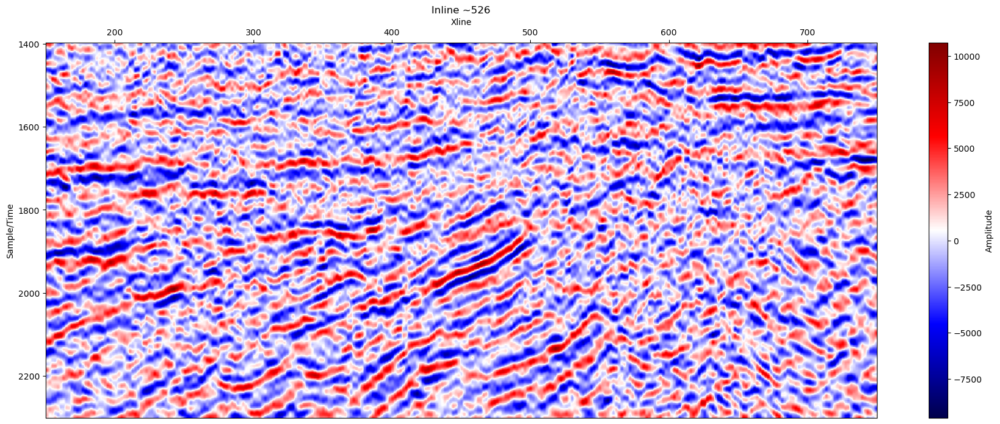

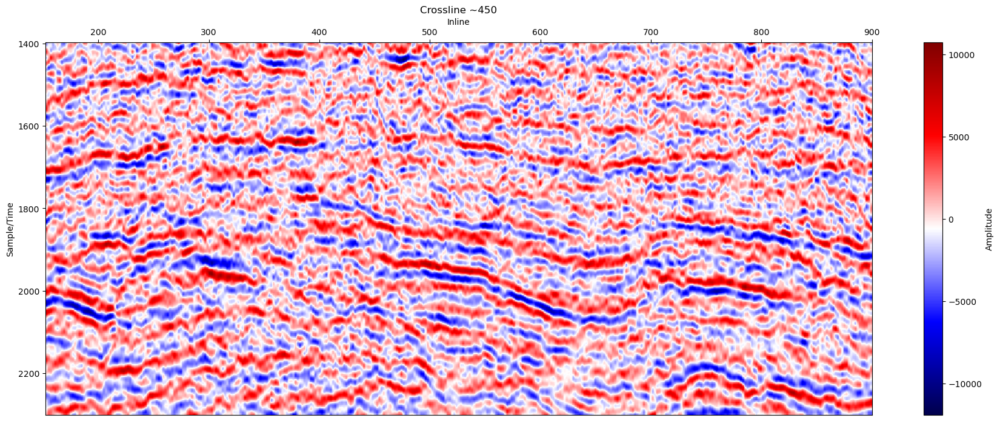

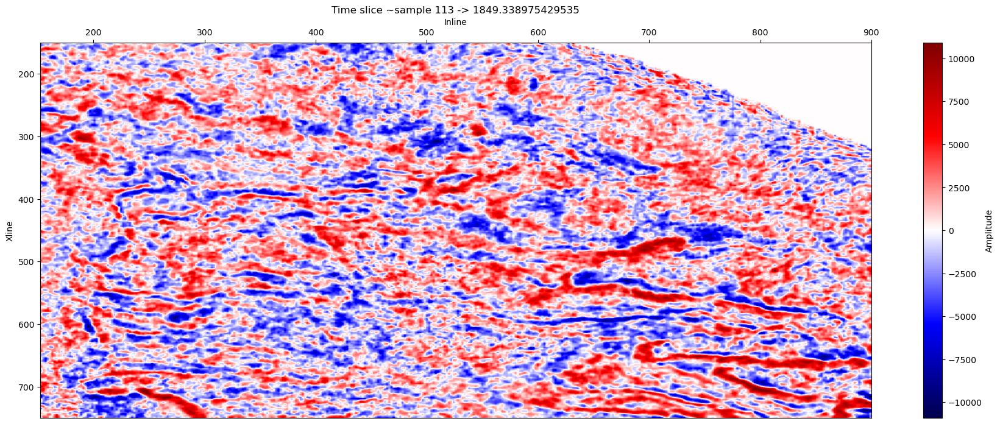

In [11]:
# Robust subvolume reader for ZGY without downsampling
import numpy as np
import pyzgy
import matplotlib.pyplot as plt

ZGY_PATH = "ST8511r92.zgy"   # change path if needed

# Open ZGY file
zgy = pyzgy.open(ZGY_PATH)
il_values = np.array(zgy.ilines)
xl_values = np.array(zgy.xlines)
samp_vals = np.array(zgy.samples)
n_il, n_xl, n_samp = len(il_values), len(xl_values), len(samp_vals)
print("ZGY dims IL x XL x SAMPLES:", n_il, n_xl, n_samp)

# --- find a getter function ---
for n in ("get_trace","trace","read_trace","read"):
    if hasattr(zgy, n):
        getter = getattr(zgy, n)
        break
else:
    raise RuntimeError("No trace getter found on ZGY object.")

# --- detect calling style ---
def probe_getter():
    il_test = il_values[n_il//2]
    xl_test = xl_values[n_xl//2]
    il_idx = n_il//2
    xl_idx = n_xl//2
    flat = il_idx * n_xl + xl_idx
    attempts = [
        ("two_args", lambda: np.asarray(getter(il_test, xl_test)).squeeze()),
        ("tuple_arg", lambda: np.asarray(getter((il_test, xl_test))).squeeze()),
        ("index_arg", lambda: np.asarray(getter(int(flat))).squeeze()),
    ]
    for name, fn in attempts:
        try:
            tr = fn()
            if tr.size > 0:
                return name
        except Exception:
            continue
    raise RuntimeError("Couldn't detect a working getter calling pattern.")

calling_style = probe_getter()
print("Detected getter calling style:", calling_style)

# --- helper function to read a trace ---
def read_trace_at(il_val, xl_val):
    il_idx = int(np.argmin(np.abs(il_values - il_val)))
    xl_idx = int(np.argmin(np.abs(xl_values - xl_val)))
    flat_index = il_idx * n_xl + xl_idx
    if calling_style == "two_args":
        tr = np.asarray(getter(il_val, xl_val)).squeeze()
    elif calling_style == "tuple_arg":
        tr = np.asarray(getter((il_val, xl_val))).squeeze()
    else:  # index_arg
        tr = np.asarray(getter(int(flat_index))).squeeze()
    return tr

# --- allocate full volume (no downsampling) ---
il_slice = il_values   # all inlines
xl_slice = xl_values   # all crosslines
samp_slice = np.arange(n_samp)  # all samples

vol = np.full((len(il_slice), len(xl_slice), len(samp_slice)), np.nan, dtype=np.float32)

# --- fill the volume ---
for i, ilv in enumerate(il_slice):
    for j, xlv in enumerate(xl_slice):
        tr = read_trace_at(ilv, xlv)
        if tr.size < n_samp:   # pad short traces
            tmp = np.full(n_samp, np.nan, dtype=np.float32)
            tmp[:tr.size] = tr
            tr = tmp
        elif tr.size > n_samp: # truncate long traces
            tr = tr[:n_samp]
        vol[i, j, :] = tr[samp_slice]

print("Loaded full volume shape (IL,XL,SAMP):", vol.shape)

# --- plot central inline, crossline, time slice ---
c_il = vol.shape[0] // 2
c_xl = vol.shape[1] // 2
c_samp = vol.shape[2] // 2

# Inline
plt.figure(figsize=(22,8))
im = plt.imshow(vol[c_il, :, :].T, aspect='auto',
           extent=[xl_slice[0], xl_slice[-1], samp_vals[-1], samp_vals[0]],
           cmap="seismic")
plt.title(f"Inline ~{il_slice[c_il]}")
# Move X axis (Xline) to top (offset above)
ax = plt.gca()
ax.xaxis.set_label_position('top')
ax.xaxis.tick_top()
ax.set_xlabel("Xline")
ax.set_ylabel("Sample/Time")
# Make time increase downward like traditional seismic
plt.colorbar(im, label="Amplitude")
plt.show()

# Crossline
plt.figure(figsize=(22,8))
im2 = plt.imshow(vol[:, c_xl, :].T, aspect='auto',
           extent=[il_slice[0], il_slice[-1], samp_vals[-1], samp_vals[0]],
           cmap="seismic")
plt.title(f"Crossline ~{xl_slice[c_xl]}")
ax = plt.gca()
ax.xaxis.set_label_position('top')
ax.xaxis.tick_top()
ax.set_xlabel("Inline")
ax.set_ylabel("Sample/Time")

plt.colorbar(im2, label="Amplitude")
plt.show()

# Time slice
plt.figure(figsize=(22,8))
im3 = plt.imshow(vol[:, :, c_samp].T, aspect='auto',
           extent=[il_slice[0], il_slice[-1], xl_slice[-1], xl_slice[0]],
           cmap="seismic")
plt.title(f"Time slice ~sample {samp_slice[c_samp]} -> {samp_vals[c_samp]}")
ax = plt.gca()
ax.xaxis.set_label_position('top')
ax.xaxis.tick_top()
ax.set_xlabel("Inline")
ax.set_ylabel("Xline")
# For a time-slice the Y axis is crossline increasing left->right; keep usual orientation
plt.colorbar(im3, label="Amplitude")
plt.show()

# --- close file when done ---
zgy.close()


Inlines: 375, Xlines: 301, Samples: 227
Detected getter style: index_arg (as reported)


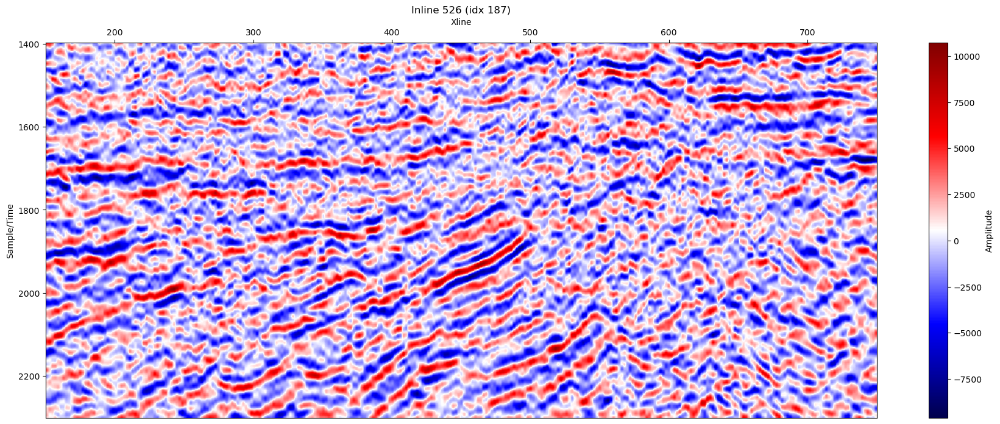

Now call plot_inline(il_idx), plot_crossline(xl_idx), or plot_timeslice(sidx) to view other slices.


In [12]:
import numpy as np
import pyzgy
import matplotlib.pyplot as plt
from functools import lru_cache
from IPython.display import clear_output

ZGY_PATH = "ST8511r92.zgy"
zgy = pyzgy.open(ZGY_PATH)

il_values = np.array(zgy.ilines)
xl_values = np.array(zgy.xlines)
samp_vals = np.array(zgy.samples)
n_il, n_xl, n_samp = len(il_values), len(xl_values), len(samp_vals)
print(f"Inlines: {n_il}, Xlines: {n_xl}, Samples: {n_samp}")
print("Detected getter style: index_arg (as reported)")

# find getter and assume index_arg
getter = None
for name in ("get_trace","trace","read_trace","read"):
    if hasattr(zgy, name):
        getter = getattr(zgy, name)
        break
if getter is None:
    raise RuntimeError("No getter found on ZGY object.")

# raw reader
def _read_trace_raw(il_idx, xl_idx):
    flat = int(il_idx) * n_xl + int(xl_idx)
    tr = np.asarray(getter(int(flat))).squeeze()
    tr = np.asarray(tr, dtype=np.float32)
    # pad/truncate to n_samp
    if tr.size < n_samp:
        tmp = np.full(n_samp, np.nan, dtype=np.float32)
        tmp[:tr.size] = tr
        tr = tmp
    elif tr.size > n_samp:
        tr = tr[:n_samp]
    return tr

# cached reader
@lru_cache(maxsize=1024)
def read_trace_cached(il_idx, xl_idx):
    return _read_trace_raw(int(il_idx), int(xl_idx))

# fetch entire inline (samples x xlines)
def get_inline(il_idx):
    cols = list(range(0, n_xl))
    mat = np.column_stack([read_trace_cached(il_idx, j) for j in cols])
    return mat, np.array(xl_values[cols]), np.array(cols)

# fetch entire crossline (samples x inlines)
def get_crossline(xl_idx):
    rows = list(range(0, n_il))
    mat = np.column_stack([read_trace_cached(i, xl_idx) for i in rows])
    return mat, np.array(il_values[rows]), np.array(rows)

# timeslice (may be slow)
def get_timeslice(sidx):
    out = np.empty((n_il, n_xl), dtype=np.float32)
    for i in range(n_il):
        for j in range(n_xl):
            out[i,j] = read_trace_cached(i, j)[sidx]
    return out

# plotting helpers (traditional seismic layout)
def plot_matrix(matrix, x_vals, y_vals, xlabel, ylabel, title, cmap='seismic'):
    plt.figure(figsize=(22,8))
    plt.imshow(matrix, aspect='auto',
               extent=[x_vals[0], x_vals[-1], y_vals[-1], y_vals[0]],
               cmap=cmap)
    ax = plt.gca()
    ax.xaxis.set_label_position('top')  # trace axis on top
    ax.xaxis.tick_top()
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.title(title)
    plt.colorbar(label='Amplitude')
    plt.show()

# Quick convenience functions
def plot_inline(il_idx=None):
    if il_idx is None:
        il_idx = n_il // 2
    mat, xvals, cols = get_inline(il_idx)
    plot_matrix(mat, xvals, samp_vals,
                xlabel='Xline', ylabel='Sample/Time',
                title=f'Inline {il_values[il_idx]} (idx {il_idx})')

def plot_crossline(xl_idx=None):
    if xl_idx is None:
        xl_idx = n_xl // 2
    mat, ivals, rows = get_crossline(xl_idx)
    plot_matrix(mat, ivals, samp_vals,
                xlabel='Inline', ylabel='Sample/Time',
                title=f'Crossline {xl_values[xl_idx]} (idx {xl_idx})')

def plot_timeslice(sidx=None):
    if sidx is None:
        sidx = n_samp // 2
    print("Reading timeslice (this may take time)...")
    mat = get_timeslice(sidx)
    plt.figure(figsize=(22,8))
    plt.imshow(mat.T, aspect='auto',
               extent=[il_values[0], il_values[-1], xl_values[-1], xl_values[0]],
               cmap='seismic')
    ax = plt.gca()
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    plt.title(f"Time slice sample {sidx} -> {samp_vals[sidx]}")
    plt.xlabel('Inline')
    plt.ylabel('Xline')
    plt.colorbar(label='Amplitude')
    plt.show()

# optional: pre-cache a full inline
def precache_inline(il_idx=None):
    if il_idx is None:
        il_idx = n_il//2
    print(f"Precaching inline {il_idx} ...")
    _ = get_inline(il_idx)
    print("Done.")

# Show center inline by default (full resolution, no downsampling)
plot_inline(il_idx=n_il//2)
print("Now call plot_inline(il_idx), plot_crossline(xl_idx), or plot_timeslice(sidx) to view other slices.")


# PLOTTING FOR THE ANY ARBITARY INLINES AND CROSS LINES

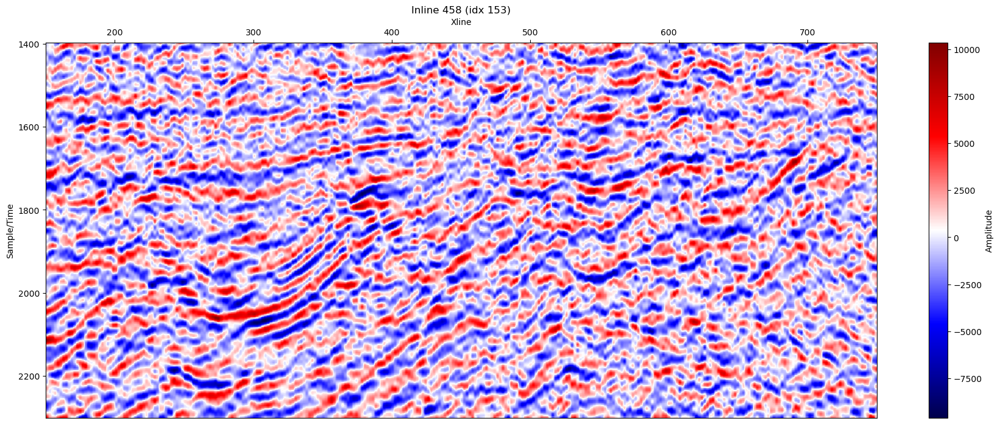

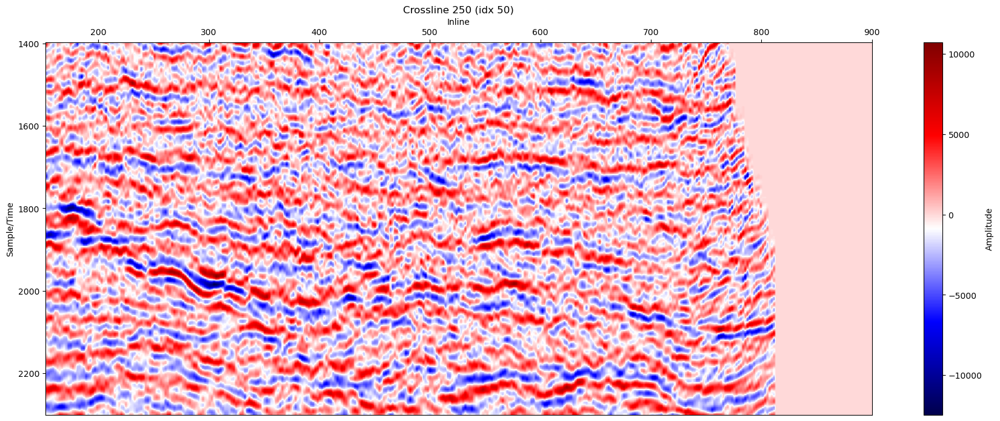

Reading timeslice (this may take time)...


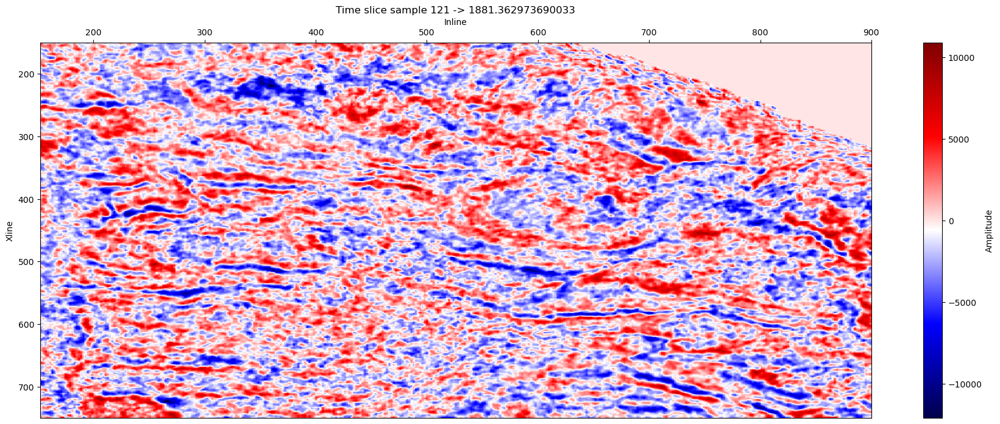

In [14]:
plot_inline(153)          # show inline index 100
plot_crossline(50)        # show crossline index 50
plot_timeslice(121)       # show sample index 120 (time slice)


# CHECK SHOT DATA

In [16]:
 df = pd.read_excel("gfaks_check_shots 2.xlsx")

In [17]:
df

,TVD,TWT,Well Name
0,1766.94,1670.077055,"""A10"""
1,1766.94,1660.775742,"""A10"""
2,1766.96,1659.983748,"""A10"""
3,1818.95,1739.100673,"""A10"""
4,1855.49,1745.924553,"""A15"""
5,1855.49,1736.015779,"""A15"""
6,1883.60,1780.688060,"""A15"""
7,1982.09,1884.269324,"""A15"""
8,1805.45,1711.823848,"""A16"""
9,1805.46,1701.609754,"""A16"""


In [18]:
df.columns

Index(['TVD', 'TWT', 'Well Name'], dtype='object')

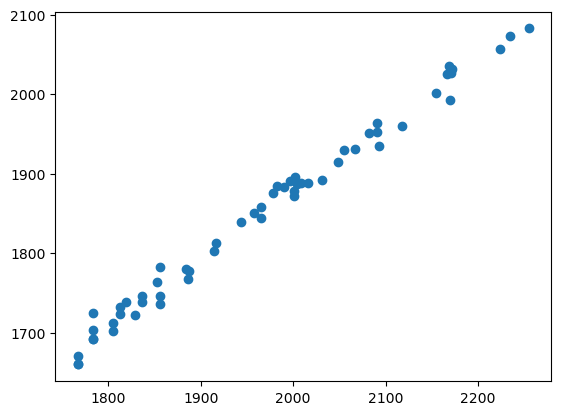

In [19]:
plt.scatter(df['TVD'],df['TWT'])

## INTERPOLATION

Linear TDR: TVD = 1.18 * TWT(s) + -213.39


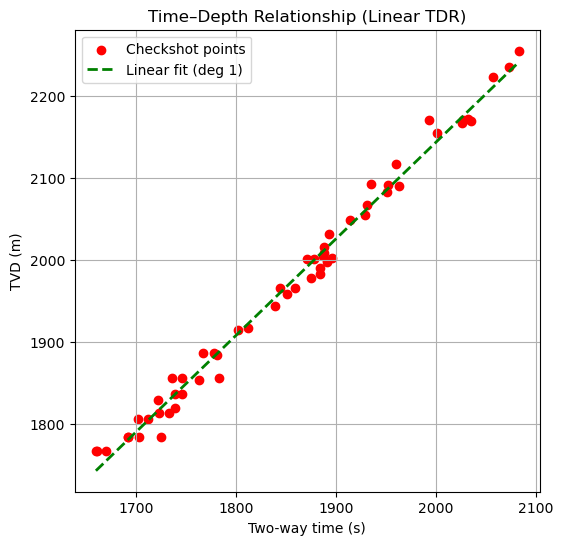

In [21]:
import numpy as np
import matplotlib.pyplot as plt

twt = df["TWT"].values   # in seconds
tvd = df["TVD"].values   # in meters

# --- Linear (degree 1) fit ---
a, b = np.polyfit(twt, tvd, 1)   # twt in seconds
print(f"Linear TDR: TVD = {a:.2f} * TWT(s) + {b:.2f}")

def twt_to_tvd_linear(t):
    return a * t + b

# --- Generate fit line ---
twt_fit = np.linspace(twt.min(), twt.max(), 200)   # seconds
tvd_fit = twt_to_tvd_linear(twt_fit)

# --- Plot (in seconds, not ms) ---
plt.figure(figsize=(6,6))
plt.scatter(twt, tvd, c='red', marker='o', label="Checkshot points")
plt.plot(twt_fit, tvd_fit, 'g--', linewidth=2, label="Linear fit (deg 1)")

plt.xlabel("Two-way time (s)")
plt.ylabel("TVD (m)")
plt.title("Time–Depth Relationship (Linear TDR)")
plt.legend()
plt.grid(True)
plt.show()


## EXTRPOLATION

Detected TWT input: ms
TWT range (ms): 1659.983748 - 2082.719983
Linear TDR (ms): TVD = 1.178325 * TWT(ms) + -213.394
Approx. average velocity ≈ 2357 m/s


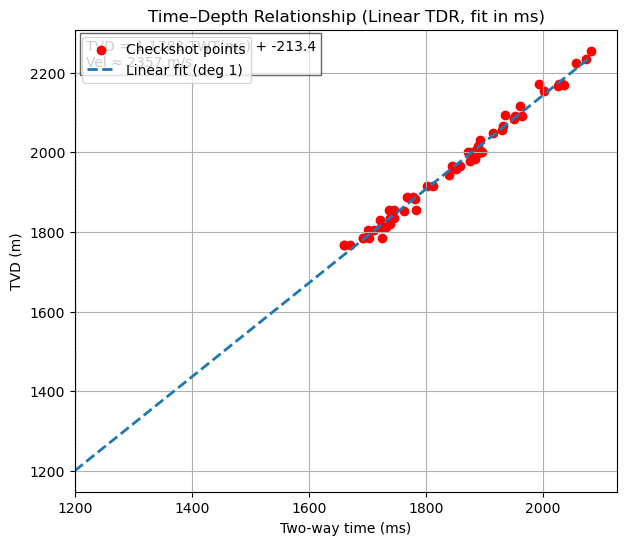

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# --- Load from your dataframe ---
TWT_raw = df["TWT"].values   # raw values (could be s or ms)
TVD = df["TVD"].values

# --- Detect units and convert to ms if needed ---
# Heuristic: typical checkshot values in seconds are < 20; in ms are > 50
if TWT_raw.max() < 20:
    # values likely in seconds -> convert to ms
    TWT_ms = TWT_raw * 1000.0
    detected_unit = "s (converted to ms)"
else:
    TWT_ms = TWT_raw.copy()
    detected_unit = "ms"

print(f"Detected TWT input: {detected_unit}")
print("TWT range (ms):", TWT_ms.min(), "-", TWT_ms.max())

# --- Linear fit in ms units ---
a, b = np.polyfit(TWT_ms, TVD, 1)   # TVD = a * TWT_ms + b
print(f"Linear TDR (ms): TVD = {a:.6f} * TWT(ms) + {b:.3f}")

# Convert slope to approximate average (one-way) velocity:
# TWT is two-way time => approximate average velocity (m/s) = 2 * a * 1000 (a is m per ms)
velocity_m_per_s = 2.0 * a * 1000.0
print(f"Approx. average velocity ≈ {velocity_m_per_s:.0f} m/s")

# --- Fit line (start at 1200 ms) ---
x_start = 1200.0
x_end = max(TWT_ms.max(), x_start + 1.0)
TWT_fit_ms = np.linspace(x_start, x_end, 300)
TVD_fit = a * TWT_fit_ms + b

# --- Plot ---
plt.figure(figsize=(7,6))
plt.scatter(TWT_ms, TVD, c="red", marker="o", label="Checkshot points")
plt.plot(TWT_fit_ms, TVD_fit, linestyle="--", linewidth=2, label="Linear fit (deg 1)")

# Mark the 1200 ms vertical line for clarity (optional)
plt.axvline(x=x_start, color="0.5", linestyle=":", linewidth=1)

# Annotate equation and velocity on plot
eq_text = f"TVD = {a:.4f}·TWT(ms) + {b:.1f}\nVel ≈ {velocity_m_per_s:.0f} m/s"
plt.annotate(eq_text, xy=(0.02, 0.98), xycoords="axes fraction",
             fontsize=10, verticalalignment="top", bbox=dict(facecolor="white", alpha=0.6))

plt.xlabel("Two-way time (ms)")
plt.ylabel("TVD (m)")
plt.title("Time–Depth Relationship (Linear TDR, fit in ms)")
plt.legend()
plt.grid(True)

# Force x-axis start at 1200 ms
plt.xlim(left=x_start)

plt.show()




# DEPTH CONVERSION USING THE EXTRAPOLATED CHECKSHOT DATA

Linear TDR (ms): TVD = 1.1783 * TWT(ms) + -213.39
Seismic shape (IL, XL, T): 375 301 227
Depth grid: min/max, samples: 1432.7254450199887 2498.725445019989 2133
Saved depth volume: seismic_depth_linear.dat with shape (375, 301, 2133)


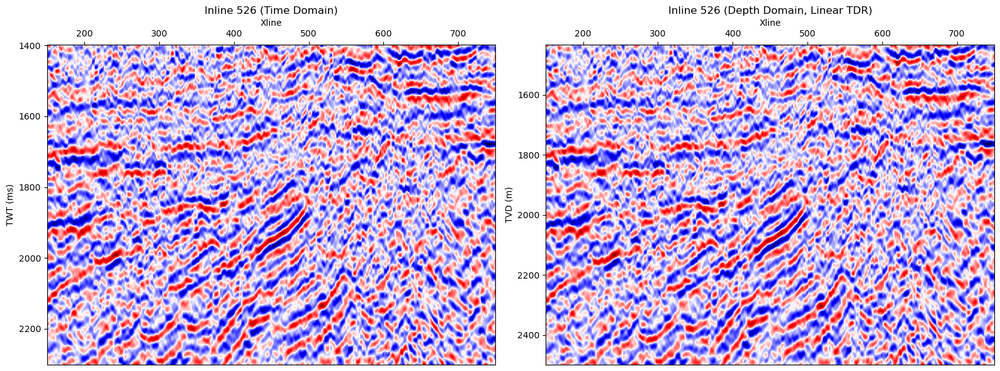

Comparison preview saved: inline_comparison_linear.png


In [25]:
import numpy as np
import pandas as pd
import pyzgy
import matplotlib.pyplot as plt

# === Input files ===
ZGY_PATH = "ST8511r92.zgy"
CHECKSHOT_XLSX = "gfaks_check_shots 2.xlsx"
OUT_DAT = "seismic_depth_linear.dat"
PREVIEW = "inline_comparison_linear.png"

# === Step 1. Load checkshot ===
cs = pd.read_excel(CHECKSHOT_XLSX)
cs.columns = cs.columns.str.strip()
TVD = cs[cs.columns[0]].astype(float).values
TWT_ms = cs[cs.columns[1]].astype(float).values  # keep in ms (correct)

# --- Linear TDR fit (degree 1, in ms) ---
a, b = np.polyfit(TWT_ms, TVD, 1)   # slope in m/ms
print(f"Linear TDR (ms): TVD = {a:.4f} * TWT(ms) + {b:.2f}")

def twt_to_tvd_linear(t_ms):
    return a * t_ms + b

# === Step 2. Open seismic ===
zgy = pyzgy.open(ZGY_PATH)
ilines = np.array(zgy.ilines)
xlines = np.array(zgy.xlines)
times_ms = np.array(zgy.samples).astype(float)   # already in ms (checkshot confirmed)

n_il, n_xl, n_t = len(ilines), len(xlines), len(times_ms)
print("Seismic shape (IL, XL, T):", n_il, n_xl, n_t)

# === Step 3. Depth grid using linear TDR ===
depth_axis = twt_to_tvd_linear(times_ms)

# extend depth grid downwards with step dz
dz = 0.5  # depth sampling in meters
depth_grid = np.arange(depth_axis.min(), depth_axis.max(), dz)
n_z = len(depth_grid)
print("Depth grid: min/max, samples:", depth_grid.min(), depth_grid.max(), n_z)

# === Step 4. Allocate output volume ===
vol_depth = np.zeros((n_il, n_xl, n_z), dtype=np.float32)

# === Step 5. Depth conversion by interpolation ===
getter = zgy.trace  # TraceAccessor object
for i in range(n_il):
    for j in range(n_xl):
        flat_idx = i * n_xl + j
        tr = np.asarray(getter[flat_idx]).squeeze()
        tr = tr[:n_t]
        vol_depth[i, j, :] = np.interp(depth_grid, depth_axis, tr, left=0, right=0)

# Save memmap
np.memmap(OUT_DAT, dtype=np.float32, mode="w+", shape=vol_depth.shape)[:] = vol_depth
print("Saved depth volume:", OUT_DAT, "with shape", vol_depth.shape)

# === Step 6. Preview (before vs after) ===
mid_il = n_il // 2

fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=False)

# --- Before: time domain (TWT in ms) ---
axes[0].imshow(
    np.array(getter[mid_il * n_xl:(mid_il + 1) * n_xl]).T,
    cmap="seismic", aspect="auto",
    extent=[xlines[0], xlines[-1], times_ms[-1], times_ms[0]]  # ms
)
axes[0].set_title(f"Inline {ilines[mid_il]} (Time Domain)")
axes[0].set_xlabel("Xline")
axes[0].set_ylabel("TWT (ms)")
axes[0].xaxis.set_label_position('top')
axes[0].xaxis.tick_top()

# --- After: depth domain (using linear TDR) ---
axes[1].imshow(
    vol_depth[mid_il, :, :].T,
    cmap="seismic", aspect="auto",
    extent=[xlines[0], xlines[-1], depth_grid[-1], depth_grid[0]]
)
axes[1].set_title(f"Inline {ilines[mid_il]} (Depth Domain, Linear TDR)")
axes[1].set_xlabel("Xline")
axes[1].set_ylabel("TVD (m)")
axes[1].xaxis.set_label_position('top')
axes[1].xaxis.tick_top()

plt.tight_layout()
plt.savefig(PREVIEW, dpi=150)
plt.show()
print("Comparison preview saved:", PREVIEW)


# DPETH CONVERSION OF THE ENTIRE  3D CUBE

In [27]:
import numpy as np
import pandas as pd
import pyzgy
import matplotlib.pyplot as plt
from tqdm import tqdm

# === Input files ===
ZGY_PATH = "ST8511r92.zgy"
CHECKSHOT_XLSX = "gfaks_check_shots 2.xlsx"
OUT_DAT = "seismic_depth_linear_extended.dat"

# === Step 1. Load checkshot (TWT in ms) ===
cs = pd.read_excel(CHECKSHOT_XLSX)
cs.columns = cs.columns.str.strip()
TVD = cs[cs.columns[0]].astype(float).values
TWT_ms = cs[cs.columns[1]].astype(float).values  # keep in ms (consistent with 1st code)

# --- Linear TDR fit (degree 1, in ms) ---
a, b = np.polyfit(TWT_ms, TVD, 1)   # slope in m/ms
print(f"Linear TDR (ms): TVD = {a:.4f} * TWT(ms) + {b:.2f}")

def twt_to_tvd_linear(t_ms):
    return a * t_ms + b

# === Step 2. Open seismic ===
zgy = pyzgy.open(ZGY_PATH)
ilines = np.array(zgy.ilines)
xlines = np.array(zgy.xlines)
times_ms = np.array(zgy.samples).astype(float)   # already in ms (checkshot confirmed)

n_il, n_xl, n_t = len(ilines), len(xlines), len(times_ms)
print("Seismic shape (IL, XL, T):", n_il, n_xl, n_t)

# === Step 3. Depth grid using linear TDR ===
depth_axis = twt_to_tvd_linear(times_ms)   # depth for each time sample
dz = 0.5                                   # depth step (m)
depth_grid = np.arange(depth_axis.min(), depth_axis.max(), dz)
n_z = len(depth_grid)
print("Depth grid: min/max, samples:", depth_grid.min(), depth_grid.max(), n_z)

# === Step 4. Allocate memory-mapped output ===
vol_depth = np.memmap(OUT_DAT, dtype=np.float32, mode="w+", shape=(n_il, n_xl, n_z))

# === Step 5. Convert every trace ===
getter = zgy.trace
for i in tqdm(range(n_il), desc="Converting inlines"):
    for j in range(n_xl):
        flat_idx = i * n_xl + j
        tr = np.asarray(getter[flat_idx]).squeeze()[:n_t]
        vol_depth[i, j, :] = np.interp(depth_grid, depth_axis, tr, left=0, right=0)

print("Saved depth volume:", OUT_DAT, "with shape", vol_depth.shape)


Linear TDR (ms): TVD = 1.1783 * TWT(ms) + -213.39
Seismic shape (IL, XL, T): 375 301 227
Depth grid: min/max, samples: 1432.7254450199887 2498.725445019989 2133


Converting inlines: 100%|████████████████████| 375/375 [00:03<00:00, 107.04it/s]

Saved depth volume: seismic_depth_linear_extended.dat with shape (375, 301, 2133)


## DEPTH CONVERTED DATA INFO

In [29]:
import numpy as np

# depth_grid was created during conversion like:
# depth_grid = np.arange(depth_axis.min(), depth_axis.max(), dz)

print("Minimum depth (TVD):", depth_grid.min(), "m")
print("Maximum depth (TVD):", depth_grid.max(), "m")


Minimum depth (TVD): 1432.7254450199887 m
Maximum depth (TVD): 2498.725445019989 m


## PLOTIING ANY ARBITARY INLINE AND CROSS LINE IN  BOTH TIME AND DEPTH DOMAIN FOR COMPARISON

In [31]:
import numpy as np
import matplotlib.pyplot as plt

def plot_inline_comparison(il_number, zgy, vol_depth, ilines, xlines, times_ms, depth_grid):
    """
    Plot inline in time (ms) and depth (m) domains side by side.
    """
    # find inline index
    il_idx = np.where(ilines == il_number)[0][0]

    # --- Time domain (from ZGY)
    n_xl = len(xlines)
    n_t = len(times_ms)
    getter = zgy.trace
    inline_time = np.array([
        np.asarray(getter[il_idx * n_xl + j]).squeeze()[:n_t] for j in range(n_xl)
    ]).T

    # --- Depth domain (from converted cube)
    inline_depth = vol_depth[il_idx, :, :].T

    # --- Plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=False)

    # Time domain (TWT in ms)
    axes[0].imshow(
        inline_time,
        cmap="seismic", aspect="auto",
        extent=[xlines[0], xlines[-1], times_ms[-1], times_ms[0]]  # already ms
    )
    axes[0].set_title(f"Inline {il_number} (Time Domain)")
    axes[0].set_xlabel("Xline")
    axes[0].set_ylabel("TWT (ms)")
    axes[0].xaxis.set_label_position('top')
    axes[0].xaxis.tick_top()

    # Depth domain
    axes[1].imshow(
        inline_depth,
        cmap="seismic", aspect="auto",
        extent=[xlines[0], xlines[-1], depth_grid[-1], depth_grid[0]]
    )
    axes[1].set_title(f"Inline {il_number} (Depth Domain)")
    axes[1].set_xlabel("Xline")
    axes[1].set_ylabel("TVD (m)")
    axes[1].xaxis.set_label_position('top')
    axes[1].xaxis.tick_top()

    plt.tight_layout()
    plt.show()


def plot_crossline_comparison(xl_number, zgy, vol_depth, ilines, xlines, times_ms, depth_grid):
    """
    Plot crossline in time (ms) and depth (m) domains side by side.
    """
    # find crossline index
    xl_idx = np.where(xlines == xl_number)[0][0]

    # --- Time domain (from ZGY)
    n_il = len(ilines)
    n_t = len(times_ms)
    getter = zgy.trace
    crossline_time = np.array([
        np.asarray(getter[i * len(xlines) + xl_idx]).squeeze()[:n_t] for i in range(n_il)
    ]).T

    # --- Depth domain (from converted cube)
    crossline_depth = vol_depth[:, xl_idx, :].T

    # --- Plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=False)

    # Time domain (TWT in ms)
    axes[0].imshow(
        crossline_time,
        cmap="seismic", aspect="auto",
        extent=[ilines[0], ilines[-1], times_ms[-1], times_ms[0]]  # already ms
    )
    axes[0].set_title(f"Crossline {xl_number} (Time Domain)")
    axes[0].set_xlabel("Inline")
    axes[0].set_ylabel("TWT (ms)")
    axes[0].xaxis.set_label_position('top')
    axes[0].xaxis.tick_top()

    # Depth domain
    axes[1].imshow(
        crossline_depth,
        cmap="seismic", aspect="auto",
        extent=[ilines[0], ilines[-1], depth_grid[-1], depth_grid[0]]
    )
    axes[1].set_title(f"Crossline {xl_number} (Depth Domain)")
    axes[1].set_xlabel("Inline")
    axes[1].set_ylabel("TVD (m)")
    axes[1].xaxis.set_label_position('top')
    axes[1].xaxis.tick_top()

    plt.tight_layout()
    plt.show()


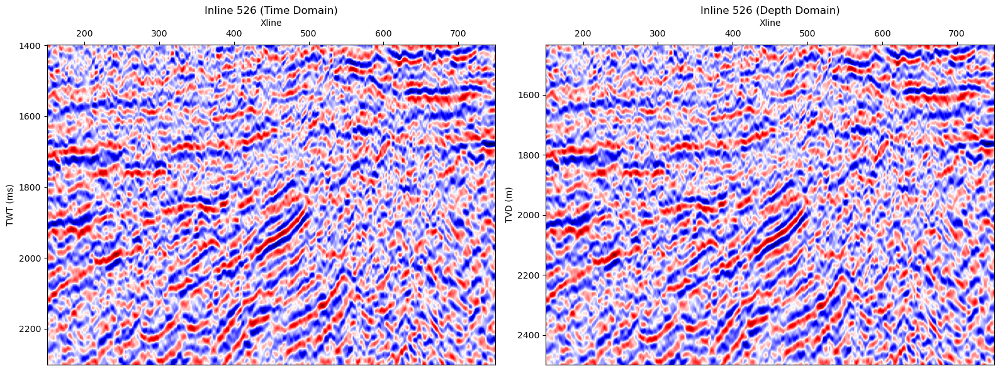

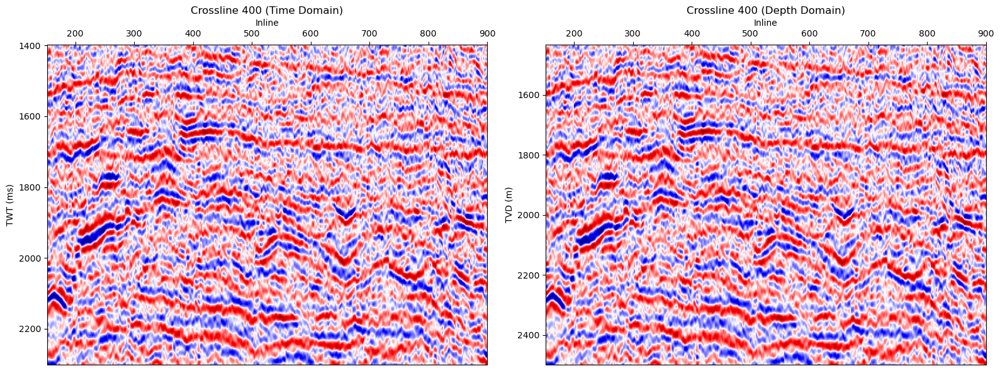

In [32]:
# Example: Inline 526
plot_inline_comparison(526, zgy, vol_depth, ilines, xlines, times_ms, depth_grid)

# Example: Crossline 400
plot_crossline_comparison(400, zgy, vol_depth, ilines, xlines, times_ms, depth_grid)


# TIEING THE WELLS WITH SEISMIC 

## FOR A10

### Deviation for A10 FILE

Columns in deviation file: ['MD', 'X', 'Y', 'Z', 'TVD', 'DX', 'DY', 'AZIM', 'INCL', 'DLS']
            MD            X            Y            Z          TVD        DX  \
0  1499.878992  456979.0637  6782712.412 -1499.878992  1499.878992  0.000000   
1  1500.031292  456979.1646  6782712.394 -1499.991677  1499.991677  0.100946   
2  1500.183692  456979.2657  6782712.377 -1500.104433  1500.104433  0.201961   
3  1500.335992  456979.3666  6782712.359 -1500.217110  1500.217110  0.302915   
4  1500.488292  456979.4676  6782712.342 -1500.329784  1500.329784  0.403874   

         DY       AZIM       INCL       DLS  
0  0.000000  99.853422  42.277454  0.528195  
1 -0.017533  99.852733  42.278832  0.644512  
2 -0.035076  99.851428  42.281145  1.030967  
3 -0.052606  99.850023  42.283222  1.211294  
4 -0.070134  99.848569  42.285656  1.316017  


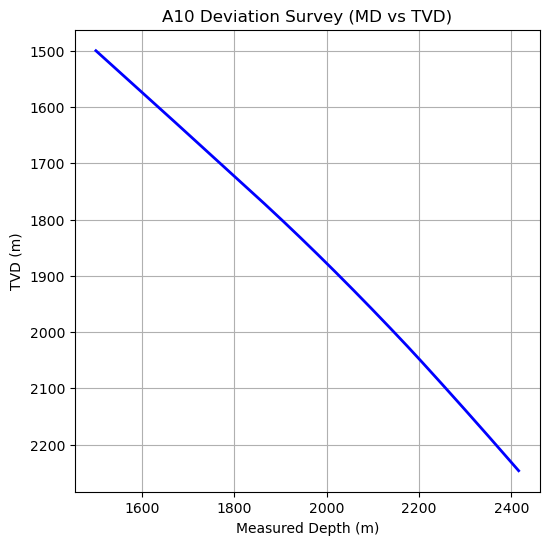

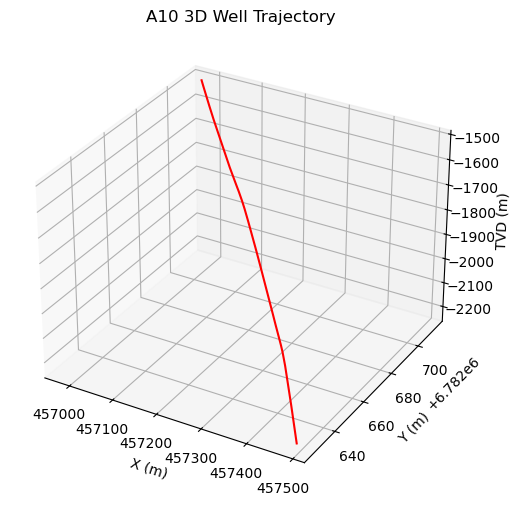

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

# === Load deviation file ===
dev_file = "A10.dev"
dev = pd.read_csv(dev_file, sep=r"\s+", comment="#", engine="python")

print("Columns in deviation file:", dev.columns.tolist())
print(dev.head())

# --- Plot MD vs TVD ---
plt.figure(figsize=(6,6))
plt.plot(dev["MD"], dev["TVD"], 'b-', lw=2)
plt.gca().invert_yaxis()  # depth increases downward
plt.xlabel("Measured Depth (m)")
plt.ylabel("TVD (m)")
plt.title("A10 Deviation Survey (MD vs TVD)")
plt.grid(True)
plt.show()

# --- Optional: 3D trajectory if X and Y are available ---
if set(["X", "Y", "TVD"]).issubset(dev.columns):
    from mpl_toolkits.mplot3d import Axes3D
    
    fig = plt.figure(figsize=(8,6))
    ax = fig.add_subplot(111, projection="3d")
    ax.plot(dev["X"], dev["Y"], -dev["TVD"], 'r-')  # negative TVD so depth goes down
    ax.set_xlabel("X (m)")
    ax.set_ylabel("Y (m)")
    ax.set_zlabel("TVD (m)")
    ax.set_title("A10 3D Well Trajectory")
    plt.show()


In [37]:
import lasio

# === Load LAS file ===
las_file = "A10.LAS"
las = lasio.read(las_file)

# === Print basic info ===
print("Well Info (Header):")
for item in las.well:
    print(f"{item.mnemonic}: {item.value} ({item.descr})")

print("\nCurves in this LAS:")
for curve in las.curves:
    print(f"{curve.mnemonic}: {curve.descr} [{curve.unit}]")

print("\nOther Metadata (Parameters):")
for param in las.params:
    print(f"{param.mnemonic}: {param.value} ({param.descr})")

# === Access data as a DataFrame ===
df = las.df()
print("\nLog Data (first 10 rows):")
print(df.head())


Well Info (Header):
STRT: 1499.879 ()
STOP: 2416.379 ()
STEP: 0.0 ()
NULL: -999.25 ()
COMP:  (COMPANY)
WELL: A10 (WELL)
FLD:  (FIELD)
LOC:  (LOCATION)
SRVC:  (SERVICE COMPANY)
DATE: Tuesday, July 02 2002 10:57:24 (DATE)
PROV:  (PROVINCE)
UWI: 02c62c82-552d-444d-bf6b-69cd07376368 (UNIQUE WELL ID)
API:  (API NUMBER)

Curves in this LAS:
DEPT: DEPTH [m]
PERM:  [m]
GAMMA:  [m]
POROSITY:  [m]
FLUVIALFACIES:  [m]
NETGROSS:  [m]

Other Metadata (Parameters):

Log Data (first 10 rows):
              PERM      GAMMA  POROSITY  FLUVIALFACIES  NETGROSS
DEPT                                                            
1499.879       NaN        NaN       NaN            NaN       0.0
1500.129       NaN        NaN       NaN            NaN       0.0
1500.629       NaN        NaN       NaN            NaN       0.0
1501.129       NaN        NaN  0.270646            0.0       0.0
1501.629  124.5799  78.869453  0.267428            0.0       0.0


## PLOTTING THE WELL WITH TVD NOT MD 

In [39]:
# Here we converted the logs into TVD by using the dev which are in MD in las file

Loaded dev table (first rows):
            MD          TVD
0  1499.878992  1499.878992
1  1500.031292  1499.991677
2  1500.183692  1500.104433
3  1500.335992  1500.217110
4  1500.488292  1500.329784
Loaded LAS curves (columns): ['PERM', 'GAMMA', 'POROSITY', 'FLUVIALFACIES', 'NETGROSS']
Depth index range (raw): 1499.879 - 2416.379
Sample after mapping to TVD:
              PERM      GAMMA  POROSITY  FLUVIALFACIES  NETGROSS
DEPT                                                            
1499.879       NaN        NaN       NaN            NaN       0.0
1500.129       NaN        NaN       NaN            NaN       0.0
1500.629       NaN        NaN       NaN            NaN       0.0
1501.129       NaN        NaN  0.270646            0.0       0.0
1501.629  124.5799  78.869453  0.267428            0.0       0.0


/var/folders/q8/tfjyhhlx4qg8hr25vbkz6cb80000gn/T/ipykernel_7162/3972891441.py:25: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(path, delim_whitespace=True, comment='#', header=None, engine='python', skip_blank_lines=True)
/var/folders/q8/tfjyhhlx4qg8hr25vbkz6cb80000gn/T/ipykernel_7162/3972891441.py:30: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(path, delim_whitespace=True, comment='#', header=0, engine='python', skip_blank_lines=True)


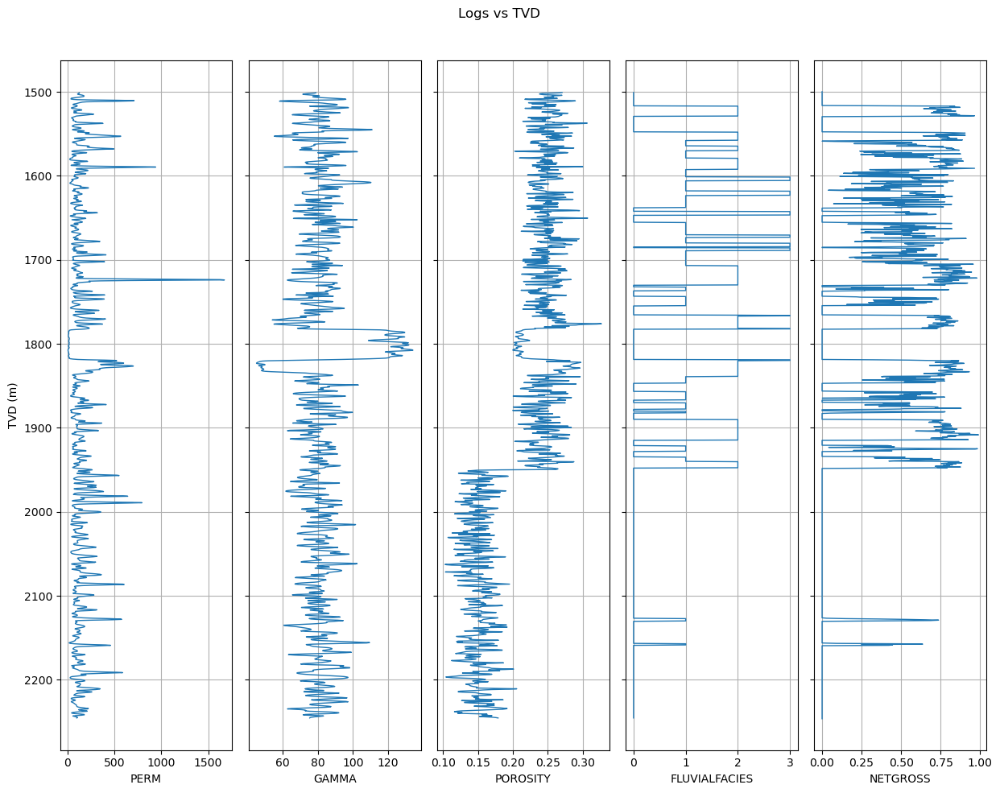

Saved: logs_vs_tvd.png


In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lasio

# -------------------------
# User inputs (update paths)
# -------------------------
DEV_FILE = "a10.dev"                        # deviation file (MD, TVD or MD, INC, AZIM)
LAS_FILE = "A10.LAS"                        # or if you already have a CSV DataFrame, use that
LOG_COLUMNS = ["PERM", "GAMMA", "POROSITY", "FLUVIALFACIES", "NETGROSS"]
OUT_FIG = "logs_vs_tvd.png"

# -------------------------
# Helper: load deviation file
# -------------------------
def load_dev_table(path):
    """
    Try to load a .dev file flexibly. Expect either:
      - columns containing MD and TVD
      - or columns MD, INC (deg) and AZIM (deg) from which we compute TVD
    Returns a DataFrame with 'MD' and 'TVD' columns (sorted by MD).
    """
    # Try whitespace-delimited read (common for .dev)
    df = pd.read_csv(path, delim_whitespace=True, comment='#', header=None, engine='python', skip_blank_lines=True)
    # attempt to identify columns by header-like first row if it contains text
    first_row = df.iloc[0].astype(str).str.upper().tolist()
    # If first row contains alphabetical tokens like 'MD' 'TVD' treat as header
    if any(x.isalpha() for x in first_row):
        df = pd.read_csv(path, delim_whitespace=True, comment='#', header=0, engine='python', skip_blank_lines=True)
    # Normalize column names
    df.columns = [str(c).strip() for c in df.columns]
    cols_upper = [c.upper() for c in df.columns]

    # Try to find MD and TVD columns
    def find_col(names):
        for name in names:
            if name in cols_upper:
                return df.columns[cols_upper.index(name)]
        return None

    md_col = find_col(["MD", "MEASUREDDEPTH", "MD(M)","DEPTH","DEPT"])
    tvd_col = find_col(["TVD","TV D","VERTDEPTH","VERTICALDEPTH","TVD(M)"])
    inc_col = find_col(["INC","INCL","INCLINATION","INCL(°)"])
    az_col = find_col(["AZ","AZI","AZIM","AZIMUTH"])

    # Case A: we have MD and TVD directly
    if md_col and tvd_col:
        dev = df[[md_col, tvd_col]].copy()
        dev.columns = ["MD", "TVD"]
        dev = dev.astype(float).sort_values("MD").reset_index(drop=True)
        return dev

    # Case B: we have MD, INC (deg) -> compute TVD via cumulative vertical component
    if md_col and inc_col:
        dev_tmp = df[[md_col, inc_col]].copy().astype(float)
        dev_tmp.columns = ["MD", "INCL"]
        dev_tmp = dev_tmp.sort_values("MD").reset_index(drop=True)
        # Compute delta MD
        dmd = np.diff(dev_tmp["MD"].values, prepend=dev_tmp["MD"].values[0])
        # Vertical increment = cos(inclination) * delta_MD
        incl_rad = np.deg2rad(dev_tmp["INCL"].values)
        # Use cumulative sum of vertical increments. For first sample assume TVD = 0 at surface or use first known TVD
        tvd = np.cumsum(np.cos(incl_rad) * dmd)
        dev = pd.DataFrame({"MD": dev_tmp["MD"].values, "TVD": tvd})
        return dev

    raise ValueError("Could not auto-detect MD/TVD or MD/INCL columns in dev file. Inspect file and update parser.")

# -------------------------
# Helper: load logs from LAS (or CSV)
# -------------------------
def load_logs_from_las(path):
    las = lasio.read(path)
    df = las.df()  # rows indexed by depth (usually depth is index)
    # ensure index name
    idxname = df.index.name if df.index.name is not None else "DEPT"
    df.index.name = "DEPT"
    # Try convert index to float
    df = df.astype(float, errors="ignore")
    return df

# -------------------------
# Map logs (indexed by MD or TVD) to TVD
# -------------------------
def map_logs_to_tvd(logs_df, dev_df):
    """
    logs_df: DataFrame indexed by depth (likely MD). Index name assumed 'DEPT' or similar.
    dev_df: DataFrame with MD and TVD columns.
    Returns a copy of logs_df with an added column 'TVD' (and reindexed by TVD if desired).
    """
    # working arrays
    dev_md = dev_df["MD"].values
    dev_tvd = dev_df["TVD"].values

    # logs index values (depth along well)
    depth_idx = logs_df.index.values.astype(float)

    # If the logs index already looks like TVD (i.e., falls within dev_tvd range), we cannot be 100% sure.
    # We'll map by interpolation: assume logs index is MD and compute TVD = interp(MD -> TVD)
    tvd_mapped = np.interp(depth_idx, dev_md, dev_tvd, left=np.nan, right=np.nan)

    logs = logs_df.copy()
    logs["TVD"] = tvd_mapped

    return logs

# -------------------------
# Main: load files and plot
# -------------------------
# 1) load dev table
dev_df = load_dev_table(DEV_FILE)
print("Loaded dev table (first rows):")
print(dev_df.head())

# 2) load logs from LAS (or use your existing DataFrame)
logs_df = load_logs_from_las(LAS_FILE)
print("Loaded LAS curves (columns):", logs_df.columns.tolist())
print("Depth index range (raw):", logs_df.index.min(), "-", logs_df.index.max())

# If your logs are in a CSV / already in a DataFrame, use that instead:
# logs_df = pd.read_csv("your_logs.csv", index_col=0)

# 3) Map logs to TVD
logs_tvd = map_logs_to_tvd(logs_df, dev_df)
print("Sample after mapping to TVD:")
print(logs_tvd[[c for c in LOG_COLUMNS if c in logs_tvd.columns]].head())

# 4) Prepare plotting: keep only rows with valid TVD
plot_df = logs_tvd.dropna(subset=["TVD"], how="any").copy()
# If you want to drop rows where all desired logs are NaN:
plot_df = plot_df[plot_df[LOG_COLUMNS].notna().any(axis=1)]

# 5) Plot tracks vs TVD (depth increasing downward)
n_tracks = len(LOG_COLUMNS)
fig, axes = plt.subplots(1, n_tracks, figsize=(2.5*n_tracks, 10), sharey=True)

if n_tracks == 1:
    axes = [axes]

for ax, col in zip(axes, LOG_COLUMNS):
    if col not in plot_df.columns:
        ax.text(0.5, 0.5, f"{col}\n(not in LAS)", transform=ax.transAxes,
                ha="center", va="center")
        ax.set_xlabel(col)
        ax.set_xticks([])
        continue

    ax.plot(plot_df[col].values, plot_df["TVD"].values, linewidth=1)
    ax.set_xlabel(col)
    ax.grid(True)
    # optionally add a histogram on top or filled area for net/gross etc

# invert y (depth increases downward)
axes[0].invert_yaxis()
axes[0].set_ylabel("TVD (m)")

plt.suptitle("Logs vs TVD")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(OUT_FIG, dpi=200)
plt.show()
print("Saved:", OUT_FIG)


In [41]:
import pyzgy

zgy = pyzgy.open("ST8511r92.zgy")

print("Inlines:", zgy.ilines[:10], "...", zgy.ilines[-10:])
print("Xlines:", zgy.xlines[:10], "...", zgy.xlines[-10:])
print("Samples:", zgy.samples[:10], "...", zgy.samples[-10:])
print("Shape (IL, XL, T):", len(zgy.ilines), len(zgy.xlines), len(zgy.samples))


Inlines: [152 154 156 158 160 162 164 166 168 170] ... [882 884 886 888 890 892 894 896 898 900]
Xlines: [150 152 154 156 158 160 162 164 166 168] ... [732 734 736 738 740 742 744 746 748 750]
Samples: [1397.         1401.00299978 1405.00599957 1409.00899935 1413.01199913
 1417.01499891 1421.0179987  1425.02099848 1429.02399826 1433.02699804] ... [2265.65095282 2269.6539526  2273.65695238 2277.65995216 2281.66295195
 2285.66595173 2289.66895151 2293.67195129 2297.67495108 2301.67795086]
Shape (IL, XL, T): 375 301 227


# INTEGRATING WELLS AND SEISMIC TOGETHER

Trace header CSV columns (sample): ['INLINE', 'XLINE', 'X', 'Y']
Mapped geometry columns: {'INLINE': 'INLINE', 'CROSSLINE': 'XLINE', 'X': 'X', 'Y': 'Y', 'TRACE_INDEX': 'X'}
Constructed real inline numbers: 152 -> 900 count: 375
Constructed real crossline numbers: 150 -> 750 count: 301
First dev->trace mapping sample (first row): {'X': 456979.0637, 'Y': 6782712.412, 'INLINE': 348.0, 'CROSSLINE': 604.0}
Nearest distances (first 5): [12.36755721 12.38002979 12.39232991 12.40647131 12.42044009]
Inferred memmap shape (n_il,n_xl,n_z): (375, 301, 2133)
Opened memmap: (375, 301, 2133) depth axis len: 2133
Well inline real: 348.0 -> il_idx: 98 inline number: 348
Well crossline real: 604.0 -> xl_idx: 227 crossline number: 604


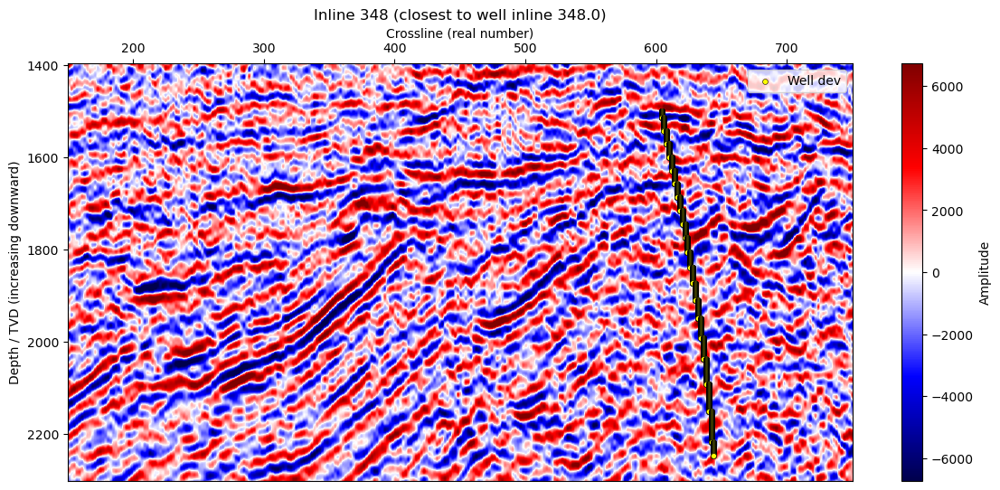

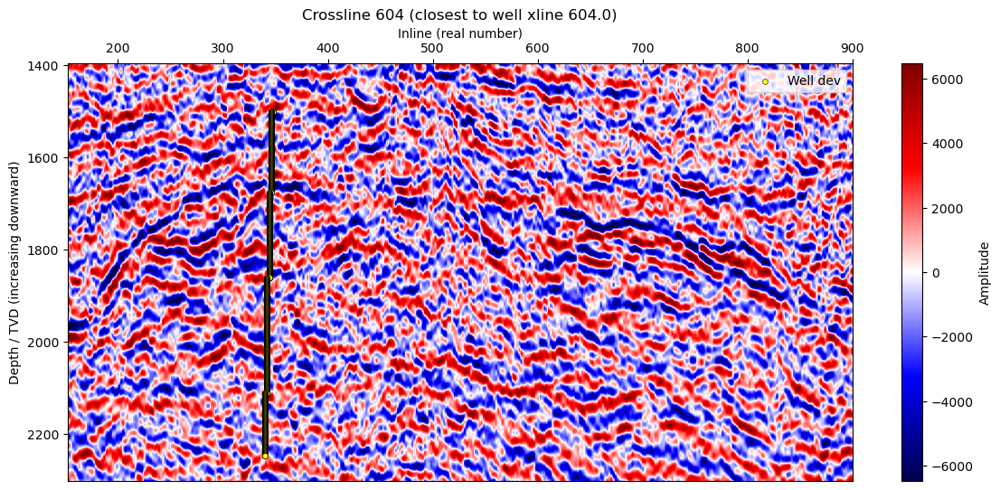


Summary:
Trace header rows used: 112875
Inline numbers: 152 -> 900 count: 375
Crossline numbers: 150 -> 750 count: 301
Selected inline index (0-based): 98 inline number: 348
Selected crossline index (0-based): 227 crossline number: 604


In [208]:
# Robust script to plot A10 well on depth-domain seismic inline & crossline sections
# - Edit file paths at top if needed
# - Requires: numpy, pandas, matplotlib, scipy (for cKDTree). lasio/pyzgy optional.
import os
import math
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

# Optional libraries
try:
    import lasio
except Exception:
    lasio = None
try:
    import pyzgy
except Exception:
    pyzgy = None

# -------------------------
# USER CONFIG / files
# -------------------------
DEPTH_DAT = "seismic_depth_linear_extended.dat"   # float32 memmap (n_il, n_xl, n_z)
DEPTH_GRID_NPY = "depth_grid.npy"                 # optional: depth axis (TVD) length = n_z
TRACE_HEADERS_CSV = "trace header x_y info.csv"   # CSV with X,Y and inline/xline or trace counters
DEV_FILE = "A10.dev"                              # deviation file: MD, TVD, X, Y (or IL/XL)
LAS_FILE = "A10.LAS"                              # optional LAS for log overlay
LOG_NAME = "GAMMA"                                # optional LAS curve name
SHOW_VERBOSE = True

# Known counts from your zgy/segy text header (from earlier conversation)
n_il = 375
n_xl = 301

# Real inline/crossline numeric ranges (textual header)
INLINE_START, INLINE_STOP, INLINE_STEP = 152, 900, 2   # produces 375 values
CROSSLINE_START, CROSSLINE_STOP, CROSSLINE_STEP = 150, 750, 2  # produces 301 values

# -------------------------
# Helper utilities
# -------------------------
def safe_read_csv(path):
    """Try multiple encodings / separators to read a CSV-like file."""
    try:
        return pd.read_csv(path)
    except UnicodeDecodeError:
        try:
            return pd.read_csv(path, encoding="latin-1")
        except Exception:
            return pd.read_csv(path, sep=r"\s+", engine="python", comment="#")
    except Exception:
        return pd.read_csv(path, sep=r"\s+", engine="python", comment="#")

def find_best_col(df, candidates):
    """Find first matching column name from candidates (case-insensitive). Return actual name or None."""
    cols_upper = {c.upper(): c for c in df.columns}
    for cand in candidates:
        cu = cand.upper()
        if cu in cols_upper:
            return cols_upper[cu]
    # substring match fallback
    for col in df.columns:
        cu = col.upper()
        for cand in candidates:
            if cand.upper() in cu or cu in cand.upper():
                return col
    return None

def force_numeric(col):
    """Coerce a pd.Series / pd.DataFrame / list-like to a 1D numpy float array robustly."""
    if isinstance(col, pd.Series):
        return pd.to_numeric(col, errors="coerce").to_numpy(dtype=float)
    if isinstance(col, pd.DataFrame):
        # pick the first sub-column that yields any numeric values
        for sub in col.columns:
            arr = pd.to_numeric(col[sub], errors="coerce")
            if arr.notna().sum() > 0:
                return arr.to_numpy(dtype=float)
        # last resort: try flattening and converting first column
        try:
            arr = pd.to_numeric(col.iloc[:, 0], errors="coerce")
            return arr.to_numpy(dtype=float)
        except Exception:
            raise TypeError("Could not coerce DataFrame to numeric 1D array")
    # other sequence-like
    try:
        return pd.to_numeric(pd.Series(col), errors="coerce").to_numpy(dtype=float)
    except Exception:
        raise TypeError("Could not coerce input to numeric array")

# -------------------------
# 1) Read trace header CSV and canonicalize geometry fields
# -------------------------
if not os.path.exists(TRACE_HEADERS_CSV):
    raise FileNotFoundError(f"Trace header CSV not found: {TRACE_HEADERS_CSV}")

df_geom = safe_read_csv(TRACE_HEADERS_CSV)
if SHOW_VERBOSE:
    print("Trace header CSV columns (sample):", list(df_geom.columns)[:40])

# candidate names
col_inline = find_best_col(df_geom, ["INLINE","INLINE_3D","TRACE_SEQUENCE_FILE","TRACE_SEQUENCE_FILE_NUMBER","TRACESEQFILE","TRACEFILE"])
col_cross  = find_best_col(df_geom, ["CROSSLINE","XLINE","X_LINE","TRACE_SEQUENCE_LINE","TRACE_SEQUENCE","TRACELINE","TraceNumber"])
col_x      = find_best_col(df_geom, ["CDP_X","SOURCE_X","GROUP_X","X","GX","SX","CDP_X_COORD","X_COORD"])
col_y      = find_best_col(df_geom, ["CDP_Y","SOURCE_Y","GROUP_Y","Y","GY","SY","CDP_Y_COORD","Y_COORD"])
col_traceindex = find_best_col(df_geom, ["TRACE_INDEX","TraceNumber","TRACE","TRACE_IDX","TRACESEQ"])

# print mapping
if SHOW_VERBOSE:
    print("Mapped geometry columns:", dict(INLINE=col_inline, CROSSLINE=col_cross, X=col_x, Y=col_y, TRACE_INDEX=col_traceindex))

# require X,Y
if col_x is None or col_y is None:
    raise RuntimeError("Trace header CSV must contain X and Y (or mappable names). Found: " + ", ".join(df_geom.columns))

# Coerce the chosen geometry columns to numeric arrays (handles DataFrame slices)
df_geom["X"] = force_numeric(df_geom[col_x])
df_geom["Y"] = force_numeric(df_geom[col_y])

# If inline/crossline exist, coerce them
if col_inline:
    df_geom["INLINE_RAW"] = force_numeric(df_geom[col_inline])
else:
    df_geom["INLINE_RAW"] = np.nan

if col_cross:
    df_geom["CROSS_RAW"] = force_numeric(df_geom[col_cross])
else:
    df_geom["CROSS_RAW"] = np.nan

# If trace index found, add it
if col_traceindex:
    df_geom["TRACE_INDEX"] = force_numeric(df_geom[col_traceindex])
else:
    df_geom["TRACE_INDEX"] = np.arange(len(df_geom)) + 1

# drop rows with no X/Y (cannot map)
df_geom = df_geom.loc[~(np.isnan(df_geom["X"]) | np.isnan(df_geom["Y"]))].reset_index(drop=True)
if len(df_geom) == 0:
    raise RuntimeError("No valid X/Y rows found in trace header CSV after numeric coercion.")

# -------------------------
# 2) Build the canonical inline & crossline real number arrays
# -------------------------
il_numbers = np.arange(INLINE_START, INLINE_STOP + 1, INLINE_STEP)
xl_numbers = np.arange(CROSSLINE_START, CROSSLINE_STOP + 1, CROSSLINE_STEP)
if len(il_numbers) != n_il or len(xl_numbers) != n_xl:
    # fallback to simple 1..N indices
    warnings.warn("Textual ranges didn't match n_il/n_xl. Falling back to 1..N indices for real numbers.")
    il_numbers = np.arange(1, n_il+1)
    xl_numbers = np.arange(1, n_xl+1)

if SHOW_VERBOSE:
    print("Constructed real inline numbers:", il_numbers[0], "->", il_numbers[-1], "count:", len(il_numbers))
    print("Constructed real crossline numbers:", xl_numbers[0], "->", xl_numbers[-1], "count:", len(xl_numbers))

# -------------------------
# 3) Convert INLINE_RAW and CROSS_RAW into real inline/cross numbers if they are counters 1..N
# -------------------------
def raw_to_real(raw_arr, real_array, n_expected):
    """If raw_arr looks like 1..n_expected, map indices to real_array; otherwise assume it's already real numbers."""
    if np.isnan(raw_arr).all():
        return np.full_like(raw_arr, np.nan, dtype=float)
    mn, mx = np.nanmin(raw_arr), np.nanmax(raw_arr)
    if mn >= 1 and mx <= n_expected:
        # treat as 1-based counters -> map
        idxs = np.rint(raw_arr).astype(int) - 1
        idxs = np.clip(idxs, 0, len(real_array)-1)
        return real_array[idxs]
    # else assume already real numbers (but still numeric)
    return raw_arr.astype(float)

df_geom["INLINE_REAL"] = raw_to_real(df_geom["INLINE_RAW"], il_numbers, n_il)
df_geom["CROSSLINE_REAL"] = raw_to_real(df_geom["CROSS_RAW"], xl_numbers, n_xl)

# If both INLINE_REAL and CROSSLINE_REAL are all NaN, attempt to fabricate counters using order (assume IL-major order)
if np.isnan(df_geom["INLINE_REAL"]).all() and np.isnan(df_geom["CROSSLINE_REAL"]).all():
    warnings.warn("Inline/Crossline numbers missing; fabricating from ordering assuming IL-major (file-per-inline).")
    # file assumed ordered: for each inline (1..n_il) crosslines 1..n_xl
    seq_file = (np.arange(len(df_geom)) // n_xl).astype(int)
    seq_line = (np.arange(len(df_geom)) % n_xl).astype(int)
    seq_file = np.clip(seq_file, 0, n_il-1)
    seq_line = np.clip(seq_line, 0, n_xl-1)
    df_geom["INLINE_REAL"] = il_numbers[seq_file]
    df_geom["CROSSLINE_REAL"] = xl_numbers[seq_line]

# -------------------------
# 4) Read DEV (well deviation) and coerce key fields
# -------------------------
if not os.path.exists(DEV_FILE):
    raise FileNotFoundError("DEV file not found: " + DEV_FILE)

try:
    dev = pd.read_csv(DEV_FILE, sep=r"\s+", comment="#", engine="python")
except Exception:
    dev = safe_read_csv(DEV_FILE)

# normalize column names and find common fields
dev.columns = [c.strip() for c in dev.columns]
dev_col_map = {}
for c in dev.columns:
    cu = c.upper()
    if cu in ("MEASUREDDEPTH","MD","DEPT","DEPTH"): dev_col_map[c] = "MD"
    if cu in ("TVD","TRUEVD","TRUEVDSS"): dev_col_map[c] = "TVD"
    if cu in ("X","XCOORD","EASTING"): dev_col_map[c] = "X"
    if cu in ("Y","YCOORD","NORTHING"): dev_col_map[c] = "Y"
    if cu in ("IL","INLINE"): dev_col_map[c] = "IL"
    if cu in ("XL","XLINE","CROSSLINE"): dev_col_map[c] = "XL"
if dev_col_map:
    dev = dev.rename(columns=dev_col_map)

# coerce numeric where present
for c in ("MD","TVD","X","Y","IL","XL"):
    if c in dev.columns:
        dev[c] = force_numeric(dev[c])

# require MD & TVD
if "MD" not in dev.columns or "TVD" not in dev.columns:
    raise RuntimeError("DEV must contain MD and TVD after mapping/renaming.")

# if X/Y missing but IL/XL present -> map to coords using df_geom lookup
if ("X" not in dev.columns or "Y" not in dev.columns) and ("IL" in dev.columns and "XL" in dev.columns):
    # create mapping dict of (inline_real, cross_real) -> X,Y (pick first)
    geom_map = {}
    for r in df_geom.itertuples(index=False):
        key = (float(r.INLINE_REAL), float(r.CROSSLINE_REAL))
        if key not in geom_map:
            geom_map[key] = (float(r.X), float(r.Y))
    xs, ys = [], []
    for ilv, xlv in zip(force_numeric(dev["IL"]), force_numeric(dev["XL"])):
        key = (float(ilv), float(xlv))
        if key in geom_map:
            xs.append(geom_map[key][0]); ys.append(geom_map[key][1])
        else:
            xs.append(np.nan); ys.append(np.nan)
    dev["X"] = np.array(xs, dtype=float)
    dev["Y"] = np.array(ys, dtype=float)
    if SHOW_VERBOSE:
        print("Used IL/XL in DEV to approximate X,Y for well points.")

# ensure at least one X,Y in dev
if dev["X"].isna().all() or dev["Y"].isna().all():
    raise RuntimeError("DEV has no usable X/Y values. Provide surface X/Y or IL/XL that map to geometry.")

# drop dev rows without X/Y
dev = dev.loc[~(np.isnan(dev["X"]) | np.isnan(dev["Y"]))].reset_index(drop=True)

# -------------------------
# 5) Map dev points to nearest seismic trace via XY KD-tree -> get inline & crossline real numbers
# -------------------------
tree = cKDTree(df_geom[["X","Y"]].values)
dists, idxs = tree.query(dev[["X","Y"]].values, k=1)
dev["INLINE"] = df_geom["INLINE_REAL"].values[idxs]
dev["CROSSLINE"] = df_geom["CROSSLINE_REAL"].values[idxs]
if SHOW_VERBOSE:
    print("First dev->trace mapping sample (first row):", dev.loc[0, ["X","Y","INLINE","CROSSLINE"]].to_dict())
    print("Nearest distances (first 5):", dists[:5])

# -------------------------
# 6) Prepare depth axis and open memmap volume
# -------------------------
if not os.path.exists(DEPTH_DAT):
    raise FileNotFoundError("Depth memmap not found: " + DEPTH_DAT)

dtype = np.float32
filesize = os.path.getsize(DEPTH_DAT)
bytes_per_sample = np.dtype(dtype).itemsize
n_samples_total = filesize // bytes_per_sample
if n_samples_total % (n_il * n_xl) != 0:
    raise RuntimeError("Depth memmap size incompatible with (n_il * n_xl). Check n_il/n_xl values.")
n_z = n_samples_total // (n_il * n_xl)
if SHOW_VERBOSE:
    print("Inferred memmap shape (n_il,n_xl,n_z):", (n_il, n_xl, n_z))

# load depth axis
if os.path.exists(DEPTH_GRID_NPY):
    depth_axis = np.load(DEPTH_GRID_NPY).astype(float)
else:
    # try zgy samples if available
    if pyzgy is not None and os.path.exists("ST8511r92.zgy"):
        zgy = pyzgy.open("ST8511r92.zgy")
        samp = np.array(zgy.samples).astype(float)
        zgy.close()
        depth_axis = -samp if np.all(samp <= 0) else samp.copy()
    else:
        depth_axis = None

if depth_axis is None:
    depth_axis = np.arange(n_z, dtype=float)
elif len(depth_axis) != n_z:
    # resample linearly to n_z
    depth_axis = np.linspace(depth_axis.min(), depth_axis.max(), n_z)

# open memmap as (n_il, n_xl, n_z)
vol = np.memmap(DEPTH_DAT, dtype=dtype, mode="r", shape=(n_il, n_xl, n_z))
if SHOW_VERBOSE:
    print("Opened memmap:", vol.shape, "depth axis len:", len(depth_axis))

# -------------------------
# 7) Find inline & crossline indices that pass through well (use first dev row)
# -------------------------
# choose a representative well row (topmost or first row)
rep_row = 0  # you can change to index that represents surface
well_inline_real = float(dev["INLINE"].iloc[rep_row])
well_crossline_real = float(dev["CROSSLINE"].iloc[rep_row])

# find nearest indices in il_numbers and xl_numbers arrays
il_idx = int(np.argmin(np.abs(il_numbers - well_inline_real)))
xl_idx = int(np.argmin(np.abs(xl_numbers - well_crossline_real)))

if SHOW_VERBOSE:
    print("Well inline real:", well_inline_real, "-> il_idx:", il_idx, "inline number:", il_numbers[il_idx])
    print("Well crossline real:", well_crossline_real, "-> xl_idx:", xl_idx, "crossline number:", xl_numbers[xl_idx])

# -------------------------
# 8) Extract sections and plot with well overlay
# -------------------------
inline_sec = vol[il_idx, :, :].T   # shape (n_z, n_xl) -> x axis is crossline numbers
crossline_sec = vol[:, xl_idx, :].T  # shape (n_z, n_il) -> x axis is inline numbers

# Inline plot (x axis = crossline real numbers)
fig, ax = plt.subplots(figsize=(14,6))
vmax = np.nanpercentile(np.abs(inline_sec), 99)
im = ax.imshow(inline_sec, cmap="seismic", aspect="auto",
               vmin=-vmax, vmax=vmax,
               extent=[xl_numbers[0], xl_numbers[-1], depth_axis[-1], depth_axis[0]])
ax.xaxis.set_label_position('top'); ax.xaxis.tick_top()
ax.set_xlabel("Crossline (real number)")
ax.set_ylabel("Depth / TVD (increasing downward)")
ax.set_title(f"Inline {il_numbers[il_idx]} (closest to well inline {well_inline_real:.1f})")

# overlay well: CROSSLINE vs TVD
xplot = force_numeric(dev["CROSSLINE"])
yplot = force_numeric(dev["TVD"])
mask = (~np.isnan(xplot)) & (~np.isnan(yplot))
if mask.sum() > 0:
    # simple single-color overlay (safe)
    ax.scatter(xplot[mask], yplot[mask], c="yellow", s=18, edgecolors="k", linewidths=0.4, label="Well dev")
else:
    warnings.warn("No valid dev CROSSLINE/TVD points to overlay on inline plot.")

plt.colorbar(im, ax=ax, label="Amplitude")

ax.legend(loc="best")
plt.show()

# Crossline plot (x axis = inline real numbers)
fig, ax = plt.subplots(figsize=(14,6))
vmax2 = np.nanpercentile(np.abs(crossline_sec), 99)
im2 = ax.imshow(crossline_sec, cmap="seismic", aspect="auto",
                vmin=-vmax2, vmax=vmax2,
                extent=[il_numbers[0], il_numbers[-1], depth_axis[-1], depth_axis[0]])
ax.xaxis.set_label_position('top'); ax.xaxis.tick_top()
ax.set_xlabel("Inline (real number)")
ax.set_ylabel("Depth / TVD (increasing downward)")
ax.set_title(f"Crossline {xl_numbers[xl_idx]} (closest to well xline {well_crossline_real:.1f})")

xplot2 = force_numeric(dev["INLINE"])
yplot2 = force_numeric(dev["TVD"])
mask2 = (~np.isnan(xplot2)) & (~np.isnan(yplot2))
if mask2.sum() > 0:
    ax.scatter(xplot2[mask2], yplot2[mask2], c="yellow", s=18, edgecolors="k", linewidths=0.4, label="Well dev")
else:
    warnings.warn("No valid dev INLINE/TVD points to overlay on crossline plot.")

plt.colorbar(im2, ax=ax, label="Amplitude")

ax.legend(loc="best")
plt.show()

# -------------------------
# Summary
# -------------------------
print("\nSummary:")
print("Trace header rows used:", len(df_geom))
print("Inline numbers:", il_numbers[0], "->", il_numbers[-1], "count:", len(il_numbers))
print("Crossline numbers:", xl_numbers[0], "->", xl_numbers[-1], "count:", len(xl_numbers))
print("Selected inline index (0-based):", il_idx, "inline number:", il_numbers[il_idx])
print("Selected crossline index (0-based):", xl_idx, "crossline number:", xl_numbers[xl_idx])


Trace header columns: ['INLINE', 'XLINE', 'X', 'Y']
Detected mapping (may be None):
  X -> X
  Y -> Y
  INLINE raw -> INLINE
  CROSS/LINE raw -> XLINE
  TRACE_INDEX -> X
Dropped 0 rows without usable X/Y; remaining rows: 112875
Constructed inline numbers: 152 -> 900 count: 375
Constructed crossline numbers: 150 -> 750 count: 301
Sample geometry (first 5 rows):
             X           Y  INLINE_RAW  CROSS_RAW  INLINE_REAL  CROSSLINE_REAL
0  451187.1800  6780245.45       152.0      150.0        152.0           150.0
1  451212.6981  6780245.45       152.0      152.0        152.0           152.0
2  451238.2162  6780245.45       152.0      154.0        152.0           154.0
3  451263.7343  6780245.45       152.0      156.0        152.0           156.0
4  451289.2524  6780245.45       152.0      158.0        152.0           158.0
Dev file columns mapping: {'X': 'X', 'Y': 'Y', 'TVD': 'TVD', 'MD': 'MD', 'IL': None, 'XL': None}
Representative well XY (from DEV row 0): 456979.0637 6782712.412
N

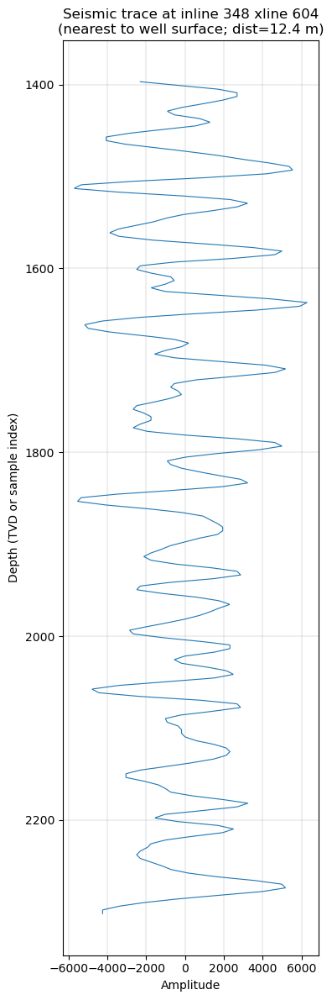


SUMMARY:
Nearest trace df_geom index: 29725
INLINE_REAL (from df_geom): 348.0
CROSSLINE_REAL (from df_geom): 604.0
Mapped to array indices -> il_idx: 98 , xl_idx: 227


In [272]:
# Extract & plot seismic trace nearest to well A10 (robust to header name variations)
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
from scipy.spatial import cKDTree

# ------------------ USER CONFIG (edit paths if needed) ------------------
DEPTH_DAT = "seismic_depth_linear_extended.dat"   # memmap shape (n_il, n_xl, n_z)
DEPTH_GRID_NPY = "depth_grid.npy"                 # optional (len == n_z)
TRACE_HEADERS_CSV = "trace header x_y info.csv"   # your trace header CSV (X,Y and maybe INLINE/XLINE or counters)
DEV_FILE = "A10.dev"                              # deviation file with X,Y,MD,TVD
# survey textual header data (from SEGY/ZGY you previously inspected)
n_il = 375
n_xl = 301
INLINE_START, INLINE_STOP, INLINE_STEP = 152, 900, 2    # produces 375 values
CROSSLINE_START, CROSSLINE_STOP, CROSSLINE_STEP = 150, 750, 2  # produces 301 values
# -----------------------------------------------------------------------

def safe_read_csv(path):
    """Try multiple encodings / separators to read a CSV-like file reliably."""
    tries = [
        {"kwargs": {}},
        {"kwargs": {"encoding": "latin-1"}},
        {"kwargs": {"sep": r"\s+", "engine": "python", "comment": "#"}},
        {"kwargs": {"sep": ",", "engine": "python", "encoding": "latin-1"}}
    ]
    for t in tries:
        try:
            return pd.read_csv(path, **t["kwargs"])
        except Exception:
            continue
    # final attempt: raw read
    return pd.read_csv(path, sep=None, engine="python", encoding="latin-1", error_bad_lines=False)

def find_best_col(df, candidates):
    """Return actual column name in df matching any candidate (case-insensitive or substring)."""
    cols_map = {c.upper(): c for c in df.columns}
    # exact match first
    for cand in candidates:
        if cand is None: 
            continue
        cu = cand.upper()
        if cu in cols_map:
            return cols_map[cu]
    # substring match
    for col in df.columns:
        cu = col.upper()
        for cand in candidates:
            if cand is None:
                continue
            if cand.upper() in cu or cu in cand.upper():
                return col
    return None

def force_numeric(series_like):
    """Coerce series-like to a 1D numpy float array robustly."""
    if isinstance(series_like, pd.Series):
        return pd.to_numeric(series_like, errors="coerce").astype(float).to_numpy()
    if isinstance(series_like, pd.DataFrame):
        # pick first column with some numeric content
        for sub in series_like.columns:
            arr = pd.to_numeric(series_like[sub], errors="coerce")
            if arr.notna().sum() > 0:
                return arr.astype(float).to_numpy()
        # fallback: take first column and coerce
        return pd.to_numeric(series_like.iloc[:, 0], errors="coerce").astype(float).to_numpy()
    # list/ndarray fallback
    return pd.to_numeric(pd.Series(series_like), errors="coerce").astype(float).to_numpy()

def raw_to_real(raw_arr, real_array, n_expected):
    """If raw_arr looks like 1..n_expected counters, map to real_array; else assume already real numbers."""
    raw = np.asarray(raw_arr, dtype=float)
    if np.isnan(raw).all():
        return np.full_like(raw, np.nan)
    mn, mx = np.nanmin(raw), np.nanmax(raw)
    # treat as 1-based counters if they lie in 1..n_expected (or close)
    if mn >= 1 and mx <= n_expected:
        idxs = np.rint(raw).astype(int) - 1
        idxs = np.clip(idxs, 0, len(real_array) - 1)
        return real_array[idxs]
    # else treat as real numbers already
    return raw

# ------------------ Step A: load trace headers and canonicalize columns ------------------
if not os.path.exists(TRACE_HEADERS_CSV):
    raise FileNotFoundError(f"Trace header CSV not found: {TRACE_HEADERS_CSV}")

df_geom = safe_read_csv(TRACE_HEADERS_CSV)
print("Trace header columns:", list(df_geom.columns)[:40])

# Candidate names for geometry fields (cover many possible header names)
col_x = find_best_col(df_geom, ["CDP_X", "SOURCE_X", "GROUP_X", "X", "GX", "SX", "X_COORD", "CDP_X_COORD"])
col_y = find_best_col(df_geom, ["CDP_Y", "SOURCE_Y", "GROUP_Y", "Y", "GY", "SY", "Y_COORD", "CDP_Y_COORD"])
col_inline = find_best_col(df_geom, ["INLINE", "INLINE_3D", "TRACE_SEQUENCE_FILE", "TRACE_SEQUENCE_FILE_NUMBER", "TRACESEQFILE", "TRACESEQ_FILE", "TRACE_SEQUENCE_FILE"])
col_cross  = find_best_col(df_geom, ["CROSSLINE", "XLINE", "X_LINE", "TRACE_SEQUENCE_LINE", "TRACE_SEQUENCE", "TraceNumber", "TraceNumber"]) 
col_traceindex = find_best_col(df_geom, ["TRACE_INDEX", "TraceNumber", "TRACE", "TRACENUMBER", "TraceIdx","TRACESEQ"])

print("Detected mapping (may be None):")
print("  X ->", col_x)
print("  Y ->", col_y)
print("  INLINE raw ->", col_inline)
print("  CROSS/LINE raw ->", col_cross)
print("  TRACE_INDEX ->", col_traceindex)

if col_x is None or col_y is None:
    raise RuntimeError("Trace header CSV must contain some X and Y coordinates (or differently named fields).")

# create robust numeric X,Y
df_geom["X"] = force_numeric(df_geom[col_x])
df_geom["Y"] = force_numeric(df_geom[col_y])

# read inline/cross "raw" if present, else NaN
df_geom["INLINE_RAW"] = force_numeric(df_geom[col_inline]) if col_inline is not None else np.full(len(df_geom), np.nan)
df_geom["CROSS_RAW"]  = force_numeric(df_geom[col_cross]) if col_cross is not None else np.full(len(df_geom), np.nan)
df_geom["TRACE_INDEX"] = force_numeric(df_geom[col_traceindex]) if col_traceindex is not None else np.arange(len(df_geom)) + 1

# drop rows w/o X/Y
before = len(df_geom)
df_geom = df_geom.loc[~(np.isnan(df_geom["X"]) | np.isnan(df_geom["Y"]))].reset_index(drop=True)
print(f"Dropped {before - len(df_geom)} rows without usable X/Y; remaining rows: {len(df_geom)}")

# ------------------ Step B: build canonical real inline/xline arrays ------------------
il_numbers = np.arange(INLINE_START, INLINE_STOP + 1, INLINE_STEP)
xl_numbers = np.arange(CROSSLINE_START, CROSSLINE_STOP + 1, CROSSLINE_STEP)
if len(il_numbers) != n_il or len(xl_numbers) != n_xl:
    warnings.warn("Textual inline/crossline ranges don't match n_il/n_xl. Falling back to simple 1..N arrays.")
    il_numbers = np.arange(1, n_il + 1)
    xl_numbers = np.arange(1, n_xl + 1)

print("Constructed inline numbers:", il_numbers[0], "->", il_numbers[-1], "count:", len(il_numbers))
print("Constructed crossline numbers:", xl_numbers[0], "->", xl_numbers[-1], "count:", len(xl_numbers))

# Map raw counters -> real numbers if appropriate
df_geom["INLINE_REAL"] = raw_to_real(df_geom["INLINE_RAW"], il_numbers, n_il)
df_geom["CROSSLINE_REAL"] = raw_to_real(df_geom["CROSS_RAW"], xl_numbers, n_xl)

# If both real arrays are all NaN (missing in header), attempt to fabricate ordering assuming IL-major order
if np.isnan(df_geom["INLINE_REAL"]).all() and np.isnan(df_geom["CROSSLINE_REAL"]).all():
    warnings.warn("No INLINE/CROSS info found in trace headers. Fabricating from ordering (IL-major) where possible.")
    # assume file lists traces inline-by-inline; length may be less than full grid if traces missing
    N = len(df_geom)
    seq_file = (np.arange(N) // n_xl).astype(int)
    seq_line = (np.arange(N) % n_xl).astype(int)
    seq_file = np.clip(seq_file, 0, len(il_numbers) - 1)
    seq_line = np.clip(seq_line, 0, len(xl_numbers) - 1)
    df_geom["INLINE_REAL"] = il_numbers[seq_file]
    df_geom["CROSSLINE_REAL"] = xl_numbers[seq_line]

# If only one of the two is NaN, try to infer the missing one by grouping:
if np.isnan(df_geom["INLINE_REAL"]).any() or np.isnan(df_geom["CROSSLINE_REAL"]).any():
    # fill any remaining NaNs by nearest neighbor mapping in XY space if feasible
    mask_missing = np.isnan(df_geom["INLINE_REAL"]) | np.isnan(df_geom["CROSSLINE_REAL"])
    if mask_missing.any() and (~mask_missing).sum() > 0:
        tree_tmp = cKDTree(df_geom.loc[~mask_missing, ["X","Y"]].values)
        d, idx = tree_tmp.query(df_geom.loc[mask_missing, ["X","Y"]].values, k=1)
        fill = df_geom.loc[~mask_missing, ["INLINE_REAL", "CROSSLINE_REAL"]].iloc[idx].to_numpy()
        df_geom.loc[mask_missing, "INLINE_REAL"] = fill[:, 0]
        df_geom.loc[mask_missing, "CROSSLINE_REAL"] = fill[:, 1]
    # if still NaN, leave as NaN

# sanity print
print("Sample geometry (first 5 rows):")
print(df_geom[["X","Y","INLINE_RAW","CROSS_RAW","INLINE_REAL","CROSSLINE_REAL"]].head())

# ------------------ Step C: load DEV (well) and get X,Y,TVD ------------------
if not os.path.exists(DEV_FILE):
    raise FileNotFoundError("Dev file not found: " + DEV_FILE)

# we try whitespace read first, else fall back to safe_read_csv
try:
    dev = pd.read_csv(DEV_FILE, sep=r"\s+", comment="#", engine="python")
except Exception:
    dev = safe_read_csv(DEV_FILE)
# normalize column names
dev.columns = [c.strip() for c in dev.columns]
# detect key columns
def find_dev_col(df, candidates):
    for cand in candidates:
        for col in df.columns:
            if col.upper() == cand.upper():
                return col
    # substring fallback
    for col in df.columns:
        for cand in candidates:
            if cand.upper() in col.upper():
                return col
    return None

dev_col_x = find_dev_col(dev, ["X","X_COORD","EASTING"])
dev_col_y = find_dev_col(dev, ["Y","Y_COORD","NORTHING"])
dev_col_tvd = find_dev_col(dev, ["TVD","TRUEVD","TRUEVDSS"])
dev_col_md = find_dev_col(dev, ["MD","MEASUREDDEPTH","DEPT","DEPTH"])
dev_col_il = find_dev_col(dev, ["IL","INLINE"])
dev_col_xl = find_dev_col(dev, ["XL","XLINE","CROSSLINE"])

print("Dev file columns mapping:", dict(X=dev_col_x, Y=dev_col_y, TVD=dev_col_tvd, MD=dev_col_md, IL=dev_col_il, XL=dev_col_xl))

# coerce numeric columns
if dev_col_x is None or dev_col_y is None:
    # if dev lacks X,Y, we will later use IL/XL if present to map to XY via df_geom
    print("WARNING: dev file does not provide X/Y directly. Will attempt to map IL/XL -> X/Y if IL/XL exist.")
else:
    dev["X"] = force_numeric(dev[dev_col_x])
    dev["Y"] = force_numeric(dev[dev_col_y])

if dev_col_tvd is not None:
    dev["TVD"] = force_numeric(dev[dev_col_tvd])
if dev_col_md is not None:
    dev["MD"] = force_numeric(dev[dev_col_md])
if dev_col_il is not None:
    dev["IL"] = force_numeric(dev[dev_col_il])
if dev_col_xl is not None:
    dev["XL"] = force_numeric(dev[dev_col_xl])

# if dev X/Y are missing but IL/XL present, try to map from df_geom
if (("X" not in dev.columns or "Y" not in dev.columns) or dev["X"].isna().all() or dev["Y"].isna().all()) and ("IL" in dev.columns and "XL" in dev.columns):
    # build mapping dict from (inline_real, cross_real) -> (X,Y)
    geom_map = {}
    for r in df_geom.itertuples(index=False):
        key = (float(r.INLINE_REAL), float(r.CROSSLINE_REAL))
        if not np.isnan(key[0]) and not np.isnan(key[1]) and key not in geom_map:
            geom_map[key] = (float(r.X), float(r.Y))
    xs = []
    ys = []
    for ilv, xlv in zip(dev["IL"].astype(float), dev["XL"].astype(float)):
        # if IL/XL in dev already are "real" numbers map directly; else try mapping via nearest in il_numbers/xl_numbers
        # find matching key
        key = (float(ilv), float(xlv))
        if key in geom_map:
            xval, yval = geom_map[key]
        else:
            # try nearest real mapping:
            il_near = il_numbers[np.argmin(np.abs(il_numbers - ilv))] if not np.isnan(ilv) else np.nan
            xl_near = xl_numbers[np.argmin(np.abs(xl_numbers - xlv))] if not np.isnan(xlv) else np.nan
            key2 = (float(il_near), float(xl_near))
            if key2 in geom_map:
                xval, yval = geom_map[key2]
            else:
                xval, yval = np.nan, np.nan
        xs.append(xval); ys.append(yval)
    dev["X"] = np.array(xs, dtype=float)
    dev["Y"] = np.array(ys, dtype=float)
    print("Mapped DEV IL/XL -> X/Y using trace header geometry where possible.")

# final check for X,Y and TVD presence
if "X" not in dev.columns or "Y" not in dev.columns or dev["X"].isna().all() or dev["Y"].isna().all():
    raise RuntimeError("DEV file lacks usable X/Y coordinates (even after attempting IL/XL mapping).")

if "TVD" not in dev.columns:
    warnings.warn("DEV file has no TVD column. The overlay will use MD if TVD missing (not ideal).")
    dev["TVD"] = dev["MD"] if "MD" in dev.columns else np.nan

# pick representative well location (surface / first row)
surface_row = 0
well_x = float(dev["X"].iloc[surface_row])
well_y = float(dev["Y"].iloc[surface_row])
print("Representative well XY (from DEV row 0):", well_x, well_y)

# ------------------ Step D: KD-tree nearest-trace mapping ------------------
coords = np.vstack((df_geom["X"].astype(float), df_geom["Y"].astype(float))).T
tree = cKDTree(coords)
dist, idx = tree.query([well_x, well_y], k=1)
idx = int(idx)
nearest_inline_real = float(df_geom.loc[idx, "INLINE_REAL"])
nearest_crossline_real = float(df_geom.loc[idx, "CROSSLINE_REAL"])
print("Nearest trace at df_geom row:", idx, "; distance (m):", float(dist))
print("Nearest INLINE_REAL:", nearest_inline_real, "CROSSLINE_REAL:", nearest_crossline_real)

# ------------------ Step E: open memmap volume and depth axis ------------------
if not os.path.exists(DEPTH_DAT):
    raise FileNotFoundError("Depth memmap not found: " + DEPTH_DAT)
dtype = np.float32
bytes_per = np.dtype(dtype).itemsize
filesize = os.path.getsize(DEPTH_DAT)
n_samples_total = filesize // bytes_per
if n_samples_total % (n_il * n_xl) != 0:
    raise RuntimeError("Depth memmap size does not match provided n_il * n_xl. Check configuration.")
n_z = n_samples_total // (n_il * n_xl)
print("Inferred depth volume shape: (n_il, n_xl, n_z) =", (n_il, n_xl, n_z))

# load depth axis (optional)
if os.path.exists(DEPTH_GRID_NPY):
    depth_axis = np.load(DEPTH_GRID_NPY).astype(float)
    if len(depth_axis) != n_z:
        depth_axis = np.linspace(depth_axis.min(), depth_axis.max(), n_z)
else:
    # try a zgy if present (optional)
    try:
        import pyzgy
        if os.path.exists("ST8511r92.zgy"):
            zgy = pyzgy.open("ST8511r92.zgy")
            samp = np.array(zgy.samples).astype(float)
            zgy.close()
            depth_axis = -samp if np.all(samp <= 0) else samp.copy()
            if len(depth_axis) != n_z:
                depth_axis = np.linspace(depth_axis.min(), depth_axis.max(), n_z)
        else:
            depth_axis = np.arange(n_z, dtype=float)
    except Exception:
        depth_axis = np.arange(n_z, dtype=float)

# memmap the cube (expected ordering: (n_il, n_xl, n_z))
vol = np.memmap(DEPTH_DAT, dtype=dtype, mode="r", shape=(n_il, n_xl, n_z))
print("Opened volume memmap.")

# ------------------ Step F: translate real inline/crossline to array indices ------------------
# find nearest index in il_numbers/xl_numbers arrays (in case real numbers not exactly matching)
il_idx = int(np.argmin(np.abs(il_numbers - nearest_inline_real)))
xl_idx = int(np.argmin(np.abs(xl_numbers - nearest_crossline_real)))
print("Nearest inline_real -> il_idx:", il_idx, " inline number:", il_numbers[il_idx])
print("Nearest crossline_real -> xl_idx:", xl_idx, " crossline number:", xl_numbers[xl_idx])

# ------------------ Step G: extract trace and plot ------------------
trace = vol[il_idx, xl_idx, :].astype(float)
if np.all(np.isnan(trace)):
    warnings.warn("Extracted trace is all-NaN. The chosen il/xl may be missing in the volume.")
# Plot amplitude vs depth (depth increasing downward)

plt.figure(figsize=(4,12))
plt.plot(trace, depth_axis, linewidth=0.8)
plt.gca().invert_yaxis()
plt.xlabel("Amplitude")
plt.ylabel("Depth (TVD or sample index)")
plt.title(f"Seismic trace at inline {il_numbers[il_idx]} xline {xl_numbers[xl_idx]}\n(nearest to well surface; dist={float(dist):.1f} m)")
plt.grid(True, linewidth=0.3)
plt.tight_layout()
plt.show()

# Also print small summary
print("\nSUMMARY:")
print("Nearest trace df_geom index:", idx)
print("INLINE_REAL (from df_geom):", nearest_inline_real)
print("CROSSLINE_REAL (from df_geom):", nearest_crossline_real)
print("Mapped to array indices -> il_idx:", il_idx, ", xl_idx:", xl_idx)




Deviation survey loaded (first rows):
            MD          TVD
0  1499.878992  1499.878992
1  1500.031292  1499.991677
2  1500.183692  1500.104433
3  1500.335992  1500.217110
4  1500.488292  1500.329784
Using Gamma Ray curve: GAMMA


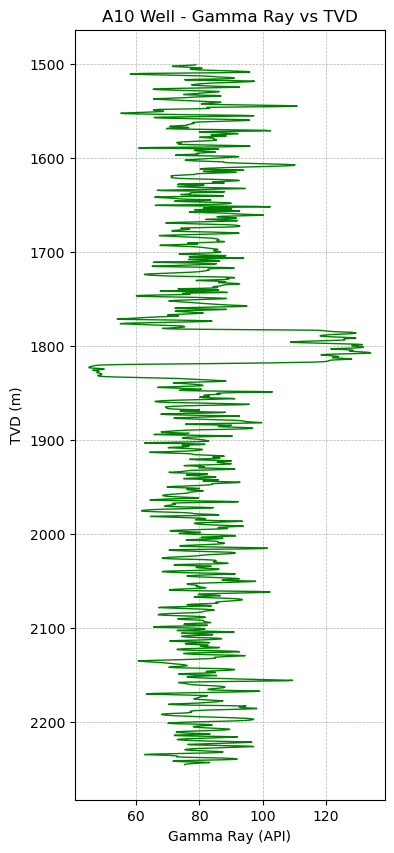

In [280]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lasio

# -------------------------
# User inputs
# -------------------------
DEV_FILE = "A10.dev"
LAS_FILE = "A10.las"
gamma_candidates = ["GR", "GAMMA", "GAPI"]  # possible gamma ray mnemonics

# -------------------------
# Step 1: Load deviation survey (MD, TVD)
# -------------------------
def load_dev_table(path):
    # Try whitespace-separated read
    df = pd.read_csv(path, sep=r"\s+", comment="#", engine="python")
    df.columns = [c.strip().upper() for c in df.columns]
    
    # Find MD and TVD columns
    md_col = [c for c in df.columns if "MD" in c][0]
    tvd_col = [c for c in df.columns if "TVD" in c][0]
    
    dev = df[[md_col, tvd_col]].copy()
    dev.columns = ["MD", "TVD"]
    dev = dev.astype(float).sort_values("MD").reset_index(drop=True)
    return dev

dev = load_dev_table(DEV_FILE)
print("Deviation survey loaded (first rows):")
print(dev.head())

# -------------------------
# Step 2: Load LAS logs
# -------------------------
las = lasio.read(LAS_FILE)

# Depth index in LAS (usually MD, already a numpy array)
md_index = las.index.astype(float)

# Find gamma ray curve
gamma_curve = None
gamma_label = None
for g in gamma_candidates:
    if g in las.curvesdict:
        gamma_curve = las[g]
        gamma_label = g
        break
if gamma_curve is None:
    raise ValueError(f"No Gamma Ray curve found in LAS. Available curves: {list(las.curvesdict.keys())}")

print(f"Using Gamma Ray curve: {gamma_label}")

# -------------------------
# Step 3: Map MD → TVD using deviation file
# -------------------------
tvd_mapped = np.interp(md_index, dev["MD"].values, dev["TVD"].values,
                       left=np.nan, right=np.nan)

# -------------------------
# Step 4: Plot Gamma Ray vs TVD
# -------------------------
plt.figure(figsize=(4,10))
plt.plot(gamma_curve, tvd_mapped, color="green", linewidth=1)
plt.gca().invert_yaxis()
plt.xlabel("Gamma Ray (API)")
plt.ylabel("TVD (m)")
plt.title("A10 Well - Gamma Ray vs TVD")
plt.grid(True, linestyle="--", linewidth=0.5)
plt.show()


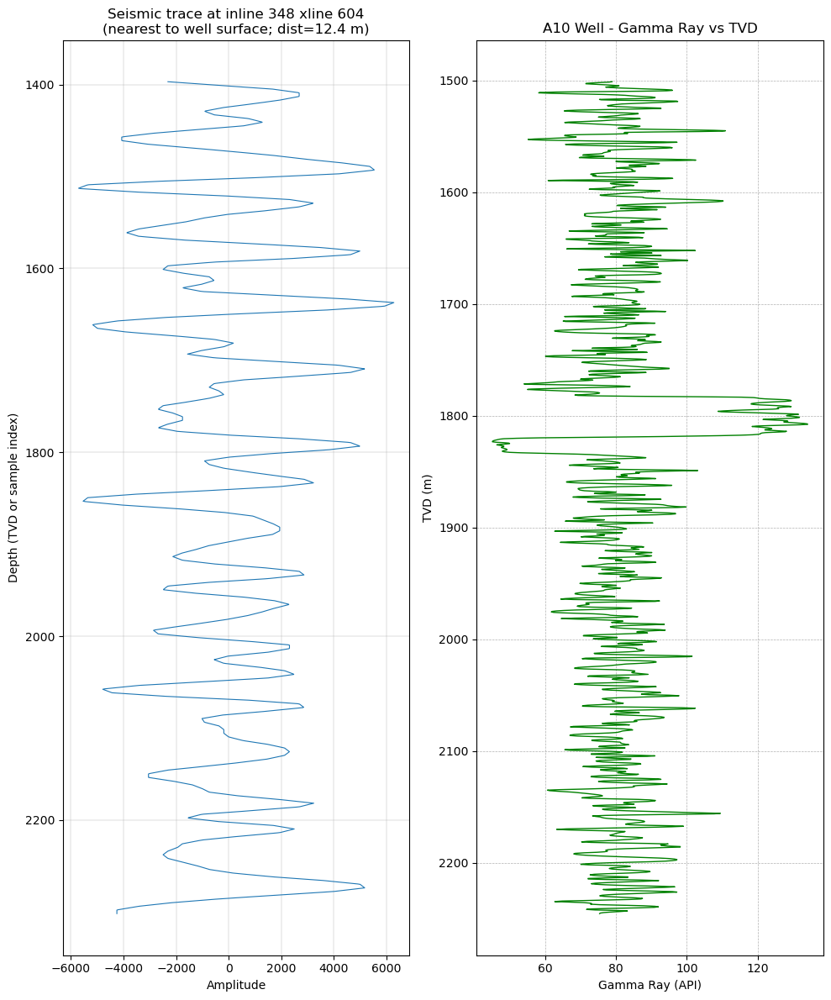

In [283]:
# ------------------ Step H: Plot both seismic trace and Gamma Ray vs TVD side by side ------------------

fig, axes = plt.subplots(1, 2, figsize=(10, 12), sharey=False)

# Left: Seismic trace
axes[0].plot(trace, depth_axis, linewidth=0.8)
axes[0].invert_yaxis()
axes[0].set_xlabel("Amplitude")
axes[0].set_ylabel("Depth (TVD or sample index)")
axes[0].set_title(f"Seismic trace at inline {il_numbers[il_idx]} xline {xl_numbers[xl_idx]}\n(nearest to well surface; dist={float(dist):.1f} m)")
axes[0].grid(True, linewidth=0.3)

# Right: Gamma Ray log vs TVD
axes[1].plot(gamma_curve, tvd_mapped, color="green", linewidth=1)
axes[1].invert_yaxis()
axes[1].set_xlabel("Gamma Ray (API)")
axes[1].set_ylabel("TVD (m)")
axes[1].set_title("A10 Well - Gamma Ray vs TVD")
axes[1].grid(True, linestyle="--", linewidth=0.5)

plt.tight_layout()
plt.show()


# DATA INFO AND DATA ENGENERRING 

In [213]:
import pathlib
import segyio

def get_segy_texthead(segy_path):
    with segyio.open(segy_path, "r", ignore_geometry=True) as f:
        # textual header is 3200 bytes, often EBCDIC or ASCII
        raw_header = f.text[0]

        # Convert to string safely
        if isinstance(raw_header, (bytes, bytearray)):
            text_header = raw_header.decode("ascii", errors="replace")
        elif isinstance(raw_header, str):
            text_header = raw_header
        else:
            # assume it's a sequence of ints
            text_header = bytes(raw_header).decode("ascii", errors="replace")

        # Split into 40 lines of 80 chars
        lines = [text_header[i:i+80] for i in range(0, len(text_header), 80)]

        print("=== Textual Header ===")
        for line in lines:
            print(line)

    return lines

# -----------------------
# Example usage
# -----------------------
filename = "ST8511r92.segy"   # your SEG-Y file
segy_file = pathlib.Path(filename)
print("SEG-Y exists:", segy_file.exists())

txt_header = get_segy_texthead(segy_file)


SEG-Y exists: True
=== Textual Header ===
C 1 SEGY OUTPUT FROM Petrel 2004 alpha Tuesday, November 09 2004 14:28:46       
C 2 Name: ST8511r92 Type: 3D Seismic                                            
C 3 First inline: 152    Last inline: 900                                       
C 4 First xline:  150    Last xline:  750                                       
C 5 X min: 451187.18 max: 458842.61 delta: 7655.43                              
C 6 Y min: 6780245.45 max: 6789707.30 delta: 9461.85                            
C 7 Time min: -2304.72 max: -1396.00 delta: 908.73                              
C 8 Trace min: -2302.72 max: -1398.00 delta: 904.72                             
C 9 Seismic min: -12306.85 max: 11257.89 delta: 23564.73                        
C10 Amplitude min: -12306.85 max: 11257.89 delta: 23564.73                      
C11 Trace sample format: IEEE floating point                                    
C12 Binary header locations:                                       

In [219]:
import segyio
import pathlib

# --- Path to your SEG-Y file ---
SEGY_PATH = pathlib.Path("ST8511r92.segy")

with segyio.open(str(SEGY_PATH), "r", ignore_geometry=True) as f:
    n_traces = f.tracecount
    print(f"Total traces: {n_traces}")

    # --- Print first trace header ---
    first_hdr = f.header[0]
    print("\n=== First Trace Header (raw) ===")
    for k, v in first_hdr.items():
        # k can be a TraceField object → get numeric + name
        try:
            keynum = int(k)
        except Exception:
            keynum = getattr(k, "value", str(k))
        keyname = getattr(k, "name", str(k))
        print(f"{keynum:5} ({keyname:20s}): {v}")

    # --- Collect all unique header keys across a sample of traces ---
    all_keys = set()
    for i in range(min(1000, n_traces)):   # scan first 1000 traces
        hdr = f.header[i]
        all_keys.update(hdr.keys())

    print("\n=== Header Keys Detected ===")
    for k in sorted(all_keys, key=lambda x: int(getattr(x,"value",x)) if str(getattr(x,"value",x)).isdigit() else str(k)):
        keynum = getattr(k, "value", str(k))
        keyname = getattr(k, "name", str(k))
        print(f"{keynum:5}  {keyname}")


Total traces: 112875

=== First Trace Header (raw) ===
    1 (TRACE_SEQUENCE_LINE ): 1
    5 (TRACE_SEQUENCE_FILE ): 152
    9 (FieldRecord         ): 0
   13 (TraceNumber         ): 1
   17 (EnergySourcePoint   ): 0
   21 (CDP                 ): 150
   25 (CDP_TRACE           ): 1
   29 (TraceIdentificationCode): 1
   31 (NSummedTraces       ): 0
   33 (NStackedTraces      ): 0
   35 (DataUse             ): 1
   37 (offset              ): 0
   41 (ReceiverGroupElevation): 0
   45 (SourceSurfaceElevation): 0
   49 (SourceDepth         ): 0
   53 (ReceiverDatumElevation): 0
   57 (SourceDatumElevation): 0
   61 (SourceWaterDepth    ): 0
   65 (GroupWaterDepth     ): 0
   69 (ElevationScalar     ): 0
   71 (SourceGroupScalar   ): 0
   73 (SourceX             ): 451199
   77 (SourceY             ): 6780362
   81 (GroupX              ): 0
   85 (GroupY              ): 0
   89 (CoordinateUnits     ): 0
   91 (WeatheringVelocity  ): 0
   93 (SubWeatheringVelocity): 0
   95 (SourceUpholeTime 

In [221]:
import segyio
import pandas as pd
import pathlib
from tqdm import tqdm

# --- Path to your SEG-Y file ---
SEGY_PATH = pathlib.Path("ST8511r92.segy")

# --- Read trace headers into DataFrame ---
with segyio.open(str(SEGY_PATH), "r", ignore_geometry=True) as f:
    n_traces = f.tracecount
    print(f"Total traces: {n_traces}")

    # discover all header keys from first trace
    first_hdr = f.header[0]
    header_keys = list(first_hdr.keys())

    rows = []
    for i in tqdm(range(n_traces), desc="Reading trace headers"):
        hdr = f.header[i]
        row = {}
        for k in header_keys:
            keyname = getattr(k, "name", str(k))
            row[keyname] = hdr[k]
        rows.append(row)

# build DataFrame
df_headers = pd.DataFrame(rows)

# --- Save to CSV ---
csv_path = "trace_headers_ST8511r92.csv"
df_headers.to_csv(csv_path, index=False)

print(f"Trace headers saved to: {csv_path}")
print("DataFrame shape:", df_headers.shape)
print("Columns:", df_headers.columns.tolist())


Total traces: 112875


Reading trace headers: 100%|██████████| 112875/112875 [00:18<00:00, 6171.38it/s]


Trace headers saved to: trace_headers_ST8511r92.csv
DataFrame shape: (112875, 89)
Columns: ['TRACE_SEQUENCE_LINE', 'TRACE_SEQUENCE_FILE', 'FieldRecord', 'TraceNumber', 'EnergySourcePoint', 'CDP', 'CDP_TRACE', 'TraceIdentificationCode', 'NSummedTraces', 'NStackedTraces', 'DataUse', 'offset', 'ReceiverGroupElevation', 'SourceSurfaceElevation', 'SourceDepth', 'ReceiverDatumElevation', 'SourceDatumElevation', 'SourceWaterDepth', 'GroupWaterDepth', 'ElevationScalar', 'SourceGroupScalar', 'SourceX', 'SourceY', 'GroupX', 'GroupY', 'CoordinateUnits', 'WeatheringVelocity', 'SubWeatheringVelocity', 'SourceUpholeTime', 'GroupUpholeTime', 'SourceStaticCorrection', 'GroupStaticCorrection', 'TotalStaticApplied', 'LagTimeA', 'LagTimeB', 'DelayRecordingTime', 'MuteTimeStart', 'MuteTimeEND', 'TRACE_SAMPLE_COUNT', 'TRACE_SAMPLE_INTERVAL', 'GainType', 'InstrumentGainConstant', 'InstrumentInitialGain', 'Correlated', 'SweepFrequencyStart', 'SweepFrequencyEnd', 'SweepLength', 'SweepType', 'SweepTraceTaperLe

In [222]:
df = pd.read_csv(csv_path)

In [223]:
df

,TRACE_SEQUENCE_LINE,TRACE_SEQUENCE_FILE,FieldRecord,TraceNumber,EnergySourcePoint,CDP,CDP_TRACE,TraceIdentificationCode,NSummedTraces,NStackedTraces,...,TransductionConstantPower,TransductionUnit,TraceIdentifier,ScalarTraceHeader,SourceType,SourceEnergyDirectionMantissa,SourceEnergyDirectionExponent,SourceMeasurementMantissa,SourceMeasurementExponent,SourceMeasurementUnit
0,1,152,0,1,0,150,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,152,0,2,0,152,16777216,256,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3,152,0,3,0,154,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,152,0,4,0,156,16777216,256,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,152,0,5,0,158,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112870,297,900,0,297,0,742,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
112871,298,900,0,298,0,744,16777216,256,0,0,...,0,0,0,0,0,0,0,0,0,0
112872,299,900,0,299,0,746,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
112873,300,900,0,300,0,748,16777216,256,0,0,...,0,0,0,0,0,0,0,0,0,0


In [224]:
df['TRACE_SEQUENCE_FILE'].unique()

array([152, 154, 156, 158, 160, 162, 164, 166, 168, 170, 172, 174, 176,
       178, 180, 182, 184, 186, 188, 190, 192, 194, 196, 198, 200, 202,
       204, 206, 208, 210, 212, 214, 216, 218, 220, 222, 224, 226, 228,
       230, 232, 234, 236, 238, 240, 242, 244, 246, 248, 250, 252, 254,
       256, 258, 260, 262, 264, 266, 268, 270, 272, 274, 276, 278, 280,
       282, 284, 286, 288, 290, 292, 294, 296, 298, 300, 302, 304, 306,
       308, 310, 312, 314, 316, 318, 320, 322, 324, 326, 328, 330, 332,
       334, 336, 338, 340, 342, 344, 346, 348, 350, 352, 354, 356, 358,
       360, 362, 364, 366, 368, 370, 372, 374, 376, 378, 380, 382, 384,
       386, 388, 390, 392, 394, 396, 398, 400, 402, 404, 406, 408, 410,
       412, 414, 416, 418, 420, 422, 424, 426, 428, 430, 432, 434, 436,
       438, 440, 442, 444, 446, 448, 450, 452, 454, 456, 458, 460, 462,
       464, 466, 468, 470, 472, 474, 476, 478, 480, 482, 484, 486, 488,
       490, 492, 494, 496, 498, 500, 502, 504, 506, 508, 510, 51

In [226]:
# --- Find columns with more than 3 unique values ---
unique_counts = df_headers.nunique()

# Filter those columns
cols_gt3 = unique_counts[unique_counts > 3].index.tolist()

print("Columns with more than 3 unique values:")
for col in cols_gt3:
    print(f"{col}: {unique_counts[col]} unique values")


Columns with more than 3 unique values:
TRACE_SEQUENCE_LINE: 301 unique values
TRACE_SEQUENCE_FILE: 375 unique values
TraceNumber: 301 unique values
CDP: 301 unique values
SourceX: 7631 unique values
SourceY: 9437 unique values


In [227]:
df.columns

Index(['TRACE_SEQUENCE_LINE', 'TRACE_SEQUENCE_FILE', 'FieldRecord',
       'TraceNumber', 'EnergySourcePoint', 'CDP', 'CDP_TRACE',
       'TraceIdentificationCode', 'NSummedTraces', 'NStackedTraces', 'DataUse',
       'offset', 'ReceiverGroupElevation', 'SourceSurfaceElevation',
       'SourceDepth', 'ReceiverDatumElevation', 'SourceDatumElevation',
       'SourceWaterDepth', 'GroupWaterDepth', 'ElevationScalar',
       'SourceGroupScalar', 'SourceX', 'SourceY', 'GroupX', 'GroupY',
       'CoordinateUnits', 'WeatheringVelocity', 'SubWeatheringVelocity',
       'SourceUpholeTime', 'GroupUpholeTime', 'SourceStaticCorrection',
       'GroupStaticCorrection', 'TotalStaticApplied', 'LagTimeA', 'LagTimeB',
       'DelayRecordingTime', 'MuteTimeStart', 'MuteTimeEND',
       'TRACE_SAMPLE_COUNT', 'TRACE_SAMPLE_INTERVAL', 'GainType',
       'InstrumentGainConstant', 'InstrumentInitialGain', 'Correlated',
       'SweepFrequencyStart', 'SweepFrequencyEnd', 'SweepLength', 'SweepType',
       'Swee

In [228]:
df['CDP_TRACE']

0                1
1         16777216
2                1
3         16777216
4                1
            ...   
112870           1
112871    16777216
112872           1
112873    16777216
112874           1
Name: CDP_TRACE, Length: 112875, dtype: int64

In [229]:
pd.DataFrame(df['CDP']).head(1000)

,CDP
0,150
1,152
2,154
3,156
4,158
...,...
995,334
996,336
997,338
998,340


In [230]:
df['TRACE_SEQUENCE_LINE'].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [231]:
df.columns

Index(['TRACE_SEQUENCE_LINE', 'TRACE_SEQUENCE_FILE', 'FieldRecord',
       'TraceNumber', 'EnergySourcePoint', 'CDP', 'CDP_TRACE',
       'TraceIdentificationCode', 'NSummedTraces', 'NStackedTraces', 'DataUse',
       'offset', 'ReceiverGroupElevation', 'SourceSurfaceElevation',
       'SourceDepth', 'ReceiverDatumElevation', 'SourceDatumElevation',
       'SourceWaterDepth', 'GroupWaterDepth', 'ElevationScalar',
       'SourceGroupScalar', 'SourceX', 'SourceY', 'GroupX', 'GroupY',
       'CoordinateUnits', 'WeatheringVelocity', 'SubWeatheringVelocity',
       'SourceUpholeTime', 'GroupUpholeTime', 'SourceStaticCorrection',
       'GroupStaticCorrection', 'TotalStaticApplied', 'LagTimeA', 'LagTimeB',
       'DelayRecordingTime', 'MuteTimeStart', 'MuteTimeEND',
       'TRACE_SAMPLE_COUNT', 'TRACE_SAMPLE_INTERVAL', 'GainType',
       'InstrumentGainConstant', 'InstrumentInitialGain', 'Correlated',
       'SweepFrequencyStart', 'SweepFrequencyEnd', 'SweepLength', 'SweepType',
       'Swee

In [232]:
df['TRACE_SEQUENCE_LINE']

0           1
1           2
2           3
3           4
4           5
         ... 
112870    297
112871    298
112872    299
112873    300
112874    301
Name: TRACE_SEQUENCE_LINE, Length: 112875, dtype: int64

In [75]:
df_filtered

,TRACE_SEQUENCE_LINE,TRACE_SEQUENCE_FILE,TraceNumber,CDP,SourceX,SourceY
0,1,152,1,150,451199,6780362
1,2,152,2,152,451224,6780362
2,3,152,3,154,451249,6780362
3,4,152,4,156,451274,6780361
4,5,152,5,158,451299,6780361
...,...,...,...,...,...,...
112870,297,900,297,742,458729,6789591
112871,298,900,298,744,458754,6789590
112872,299,900,299,746,458779,6789590
112873,300,900,300,748,458804,6789590


In [78]:
df_filtered.columns

Index(['TRACE_SEQUENCE_LINE', 'TRACE_SEQUENCE_FILE', 'TraceNumber', 'CDP',
       'SourceX', 'SourceY'],
      dtype='object')

In [86]:
df_filtered['TRACE_SEQUENCE_FILE'].unique()

array([152, 154, 156, 158, 160, 162, 164, 166, 168, 170, 172, 174, 176,
       178, 180, 182, 184, 186, 188, 190, 192, 194, 196, 198, 200, 202,
       204, 206, 208, 210, 212, 214, 216, 218, 220, 222, 224, 226, 228,
       230, 232, 234, 236, 238, 240, 242, 244, 246, 248, 250, 252, 254,
       256, 258, 260, 262, 264, 266, 268, 270, 272, 274, 276, 278, 280,
       282, 284, 286, 288, 290, 292, 294, 296, 298, 300, 302, 304, 306,
       308, 310, 312, 314, 316, 318, 320, 322, 324, 326, 328, 330, 332,
       334, 336, 338, 340, 342, 344, 346, 348, 350, 352, 354, 356, 358,
       360, 362, 364, 366, 368, 370, 372, 374, 376, 378, 380, 382, 384,
       386, 388, 390, 392, 394, 396, 398, 400, 402, 404, 406, 408, 410,
       412, 414, 416, 418, 420, 422, 424, 426, 428, 430, 432, 434, 436,
       438, 440, 442, 444, 446, 448, 450, 452, 454, 456, 458, 460, 462,
       464, 466, 468, 470, 472, 474, 476, 478, 480, 482, 484, 486, 488,
       490, 492, 494, 496, 498, 500, 502, 504, 506, 508, 510, 51

In [90]:
df_filtered

,Crossline,Inline,TraceNumber,CDP,SourceX,SourceY
0,1,152,1,150,451199,6780362
1,2,152,2,152,451224,6780362
2,3,152,3,154,451249,6780362
3,4,152,4,156,451274,6780361
4,5,152,5,158,451299,6780361
...,...,...,...,...,...,...
112870,297,900,297,742,458729,6789591
112871,298,900,298,744,458754,6789590
112872,299,900,299,746,458779,6789590
112873,300,900,300,748,458804,6789590


In [103]:
df_filtered['Inline'].unique()

array([152, 154, 156, 158, 160, 162, 164, 166, 168, 170, 172, 174, 176,
       178, 180, 182, 184, 186, 188, 190, 192, 194, 196, 198, 200, 202,
       204, 206, 208, 210, 212, 214, 216, 218, 220, 222, 224, 226, 228,
       230, 232, 234, 236, 238, 240, 242, 244, 246, 248, 250, 252, 254,
       256, 258, 260, 262, 264, 266, 268, 270, 272, 274, 276, 278, 280,
       282, 284, 286, 288, 290, 292, 294, 296, 298, 300, 302, 304, 306,
       308, 310, 312, 314, 316, 318, 320, 322, 324, 326, 328, 330, 332,
       334, 336, 338, 340, 342, 344, 346, 348, 350, 352, 354, 356, 358,
       360, 362, 364, 366, 368, 370, 372, 374, 376, 378, 380, 382, 384,
       386, 388, 390, 392, 394, 396, 398, 400, 402, 404, 406, 408, 410,
       412, 414, 416, 418, 420, 422, 424, 426, 428, 430, 432, 434, 436,
       438, 440, 442, 444, 446, 448, 450, 452, 454, 456, 458, 460, 462,
       464, 466, 468, 470, 472, 474, 476, 478, 480, 482, 484, 486, 488,
       490, 492, 494, 496, 498, 500, 502, 504, 506, 508, 510, 51

In [105]:
df_filtered['Crossline'].unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [107]:
import numpy as np
import pandas as pd

# Example: your df_filtered with renamed columns
# df_filtered = df_filtered.rename(columns={
#     "TRACE_SEQUENCE_LINE": "Crossline",
#     "TRACE_SEQUENCE_FILE": "Inline"
# })

# Build mapping dictionary
crossline_mapping = dict(zip(range(1, 302), np.arange(150, 752, 2)))

# Apply mapping to Crossline column
df_filtered["Crossline"] = df_filtered["Crossline"].map(crossline_mapping)

print(df_filtered[["Inline", "Crossline"]].head(20))
print("Crossline min:", df_filtered["Crossline"].min(), 
      "max:", df_filtered["Crossline"].max(), 
      "unique count:", df_filtered["Crossline"].nunique())


    Inline  Crossline
0      152        150
1      152        152
2      152        154
3      152        156
4      152        158
5      152        160
6      152        162
7      152        164
8      152        166
9      152        168
10     152        170
11     152        172
12     152        174
13     152        176
14     152        178
15     152        180
16     152        182
17     152        184
18     152        186
19     152        188
Crossline min: 150 max: 750 unique count: 301


In [111]:
df_filtered

,Crossline,Inline,TraceNumber,CDP,SourceX,SourceY
0,150,152,1,150,451199,6780362
1,152,152,2,152,451224,6780362
2,154,152,3,154,451249,6780362
3,156,152,4,156,451274,6780361
4,158,152,5,158,451299,6780361
...,...,...,...,...,...,...
112870,742,900,297,742,458729,6789591
112871,744,900,298,744,458754,6789590
112872,746,900,299,746,458779,6789590
112873,748,900,300,748,458804,6789590


In [126]:
df_filtered['Inline'].unique()

array([152, 154, 156, 158, 160, 162, 164, 166, 168, 170, 172, 174, 176,
       178, 180, 182, 184, 186, 188, 190, 192, 194, 196, 198, 200, 202,
       204, 206, 208, 210, 212, 214, 216, 218, 220, 222, 224, 226, 228,
       230, 232, 234, 236, 238, 240, 242, 244, 246, 248, 250, 252, 254,
       256, 258, 260, 262, 264, 266, 268, 270, 272, 274, 276, 278, 280,
       282, 284, 286, 288, 290, 292, 294, 296, 298, 300, 302, 304, 306,
       308, 310, 312, 314, 316, 318, 320, 322, 324, 326, 328, 330, 332,
       334, 336, 338, 340, 342, 344, 346, 348, 350, 352, 354, 356, 358,
       360, 362, 364, 366, 368, 370, 372, 374, 376, 378, 380, 382, 384,
       386, 388, 390, 392, 394, 396, 398, 400, 402, 404, 406, 408, 410,
       412, 414, 416, 418, 420, 422, 424, 426, 428, 430, 432, 434, 436,
       438, 440, 442, 444, 446, 448, 450, 452, 454, 456, 458, 460, 462,
       464, 466, 468, 470, 472, 474, 476, 478, 480, 482, 484, 486, 488,
       490, 492, 494, 496, 498, 500, 502, 504, 506, 508, 510, 51

In [130]:
df_filtered['Crossline'].unique()

array([150, 152, 154, 156, 158, 160, 162, 164, 166, 168, 170, 172, 174,
       176, 178, 180, 182, 184, 186, 188, 190, 192, 194, 196, 198, 200,
       202, 204, 206, 208, 210, 212, 214, 216, 218, 220, 222, 224, 226,
       228, 230, 232, 234, 236, 238, 240, 242, 244, 246, 248, 250, 252,
       254, 256, 258, 260, 262, 264, 266, 268, 270, 272, 274, 276, 278,
       280, 282, 284, 286, 288, 290, 292, 294, 296, 298, 300, 302, 304,
       306, 308, 310, 312, 314, 316, 318, 320, 322, 324, 326, 328, 330,
       332, 334, 336, 338, 340, 342, 344, 346, 348, 350, 352, 354, 356,
       358, 360, 362, 364, 366, 368, 370, 372, 374, 376, 378, 380, 382,
       384, 386, 388, 390, 392, 394, 396, 398, 400, 402, 404, 406, 408,
       410, 412, 414, 416, 418, 420, 422, 424, 426, 428, 430, 432, 434,
       436, 438, 440, 442, 444, 446, 448, 450, 452, 454, 456, 458, 460,
       462, 464, 466, 468, 470, 472, 474, 476, 478, 480, 482, 484, 486,
       488, 490, 492, 494, 496, 498, 500, 502, 504, 506, 508, 51

In [132]:
# Save DataFrame to CSV
csv_path = "df_filtered.csv"
df_filtered.to_csv(csv_path, index=False)

print(f"Saved CSV to {csv_path}")


Saved CSV to df_filtered.csv


In [134]:
df_filtered

,Crossline,Inline,TraceNumber,CDP,SourceX,SourceY
0,150,152,1,150,451199,6780362
1,152,152,2,152,451224,6780362
2,154,152,3,154,451249,6780362
3,156,152,4,156,451274,6780361
4,158,152,5,158,451299,6780361
...,...,...,...,...,...,...
112870,742,900,297,742,458729,6789591
112871,744,900,298,744,458754,6789590
112872,746,900,299,746,458779,6789590
112873,748,900,300,748,458804,6789590


In [138]:
df_filtered['CDP'].unique()

array([150, 152, 154, 156, 158, 160, 162, 164, 166, 168, 170, 172, 174,
       176, 178, 180, 182, 184, 186, 188, 190, 192, 194, 196, 198, 200,
       202, 204, 206, 208, 210, 212, 214, 216, 218, 220, 222, 224, 226,
       228, 230, 232, 234, 236, 238, 240, 242, 244, 246, 248, 250, 252,
       254, 256, 258, 260, 262, 264, 266, 268, 270, 272, 274, 276, 278,
       280, 282, 284, 286, 288, 290, 292, 294, 296, 298, 300, 302, 304,
       306, 308, 310, 312, 314, 316, 318, 320, 322, 324, 326, 328, 330,
       332, 334, 336, 338, 340, 342, 344, 346, 348, 350, 352, 354, 356,
       358, 360, 362, 364, 366, 368, 370, 372, 374, 376, 378, 380, 382,
       384, 386, 388, 390, 392, 394, 396, 398, 400, 402, 404, 406, 408,
       410, 412, 414, 416, 418, 420, 422, 424, 426, 428, 430, 432, 434,
       436, 438, 440, 442, 444, 446, 448, 450, 452, 454, 456, 458, 460,
       462, 464, 466, 468, 470, 472, 474, 476, 478, 480, 482, 484, 486,
       488, 490, 492, 494, 496, 498, 500, 502, 504, 506, 508, 51

In [ ]:
N